In [1]:
# Initialize Notebook
from IPython.core.display import HTML,Image
#%run ../library/v1.0.5/init.ipy
HTML('''<script> code_show=true;  function code_toggle() {  if (code_show){  $('div.input').hide();  } else {  $('div.input').show();  }  code_show = !code_show }  $( document ).ready(code_toggle); </script> <form action="javascript:code_toggle()"><input type="submit" value="Toggle Code"></form>''')

In [526]:
import gc, argparse, sys, os, errno
from functools import reduce
import h5py
%pylab inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 120
import seaborn as sns
import h5py
import os
from tqdm import tqdm_notebook as tqdm
import scipy
import sklearn
from scipy.stats import pearsonr
import warnings
warnings.filterwarnings('ignore')
from bokeh.io import output_notebook, show
output_notebook()
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.metrics import roc_curve,roc_auc_score
from sklearn.metrics import auc
from sklearn.preprocessing import RobustScaler,MinMaxScaler,StandardScaler
from sklearn.neighbors import NearestNeighbors
tableau20 = np.array([(31, 119, 180), (174, 199, 232), (255, 127, 14), (255, 187, 120),  
             (44, 160, 44), (152, 223, 138), (214, 39, 40), (255, 152, 150),  
             (148, 103, 189), (197, 176, 213), (140, 86, 75), (196, 156, 148),  
             (227, 119, 194), (247, 182, 210), (127, 127, 127), (199, 199, 199),  
             (188, 189, 34), (219, 219, 141), (23, 190, 207), (158, 218, 229)])/255.
from bokeh.palettes import Category20c
styles = ["white","dark",'whitegrid',"darkgrid"]
contexts = ['paper','talk','poster','notebook']
sns.set_context(contexts[2])
sns.set_style(styles[0])
#plt.rc('font', family='serif')
#plt.rc('xtick', labelsize='x-small')
#plt.rc('ytick', labelsize='x-small')
#rcParams['font.weight'] = 'bold'
plt.rcParams['figure.dpi'] = 120

Populating the interactive namespace from numpy and matplotlib


Loading BokehJS ...

In [4]:
cd /home/chenxupeng/projects/exseek

/home/chenxupeng/projects/exseek


# Statistics

In [5]:
dataset='scirep'
sequencing_type = 'short'

file_counts = 'output/'+dataset+'/summary/read_counts.txt'
file_length_path = 'output/'+dataset+'/stats/mapped_read_length_by_sample/'
file_length_path_insert = 'output/'+dataset+'/stats/mapped_insert_size_by_sample/'
plot_save_path = 'output/'+dataset+'/plots/'
if sequencing_type == 'short':
    exp_mx_name = 'domains_combined'
elif sequencing_type =='long':
    exp_mx_name = 'featurecounts'

In [6]:
#Get table
def get_counts_ratio_table(file_counts,sequencing_type='short'):
    df = pd.read_table(file_counts, index_col=0)
    if sequencing_type == 'short':
        rna_types = [s.split('.')[0] for s in df.index.tolist() if s.endswith('.mapped')]
        rna_types = 'rRNA,miRNA,piRNA,Y_RNA,srpRNA,tRNA,snRNA,snoRNA,lncRNA,mRNA,tucpRNA,intron,promoter,enhancer,repeats,circRNA,other'.split(',')
        mapped_ratio = {}
        mapped_count = {}
        for sample_id in df.columns.tolist():
            mapped_ratio[sample_id] = {}
            mapped_count[sample_id] = {}
            clean_counts = float(df.loc['clean.unmapped', sample_id])
            for rna_type in rna_types:
                mapped_ratio[sample_id][rna_type] = df.loc[rna_type + '.mapped', sample_id]/(
                    clean_counts - df.loc['other.unmapped', sample_id])
                mapped_count[sample_id][rna_type] = df.loc[rna_type + '.mapped', sample_id]
            for region in ('promoter', 'enhancer', 'intron','repeats','circRNA'):
                mapped_ratio[sample_id]['other'] -= mapped_ratio[sample_id][region]
                mapped_count[sample_id]['other'] -= mapped_count[sample_id][region]
        mapped_count = pd.DataFrame.from_records(mapped_count)        
        mapped_ratio = pd.DataFrame.from_records(mapped_ratio)
        mapped_count = mapped_count.loc[rna_types, :]
        mapped_ratio = mapped_ratio.loc[rna_types, :]
        return mapped_count.T, mapped_ratio.T
    elif sequencing_type =='long':
        index_1 = np.array(['rRNA','genome','remove_duplicates'])
        index_2 = np.array(['Y_RNA','circRNA','lncRNA','mRNA','snRNA','snoRNA','srpRNA','tucpRNA'])
        mapped_count_1 = df.loc[index_1]
        mapped_ratio_1 = mapped_count_1/df.loc['clean']
        mapped_count_2 = df.loc[index_2]
        mapped_ratio_2 = mapped_count_2/df.loc['remove_duplicates']
        return mapped_count_1.T, mapped_ratio_1.T,mapped_count_2.T, mapped_ratio_2.T
def get_length_table(file_length_path,sequencing_type='short'):
    length_table = {}
    for i in os.listdir(file_length_path):
        if sequencing_type =='short':
            length_table[i] = pd.read_table(file_length_path+i,index_col=0).iloc[16:52]
        elif sequencing_type =='long':
            length_table[i] = pd.read_table(file_length_path+i,index_col=0).iloc[16:152]
    sample_names = np.array(os.listdir(file_length_path))
    length_table_sum = length_table[sample_names[0]]
    for i in sample_names[1:]:
        length_table_sum += length_table[i]
    return length_table_sum/length_table_sum.sum(axis=0)



In [7]:
if sequencing_type == 'short': 
    table_count, table_ratio = get_counts_ratio_table(file_counts)
    length_table = get_length_table(file_length_path,sequencing_type=sequencing_type)
    rnanames=np.array(table_ratio.columns).astype('str')
elif sequencing_type == 'long': 
    table_count_1, table_ratio_1,table_count_2, table_ratio_2 = \
                    get_counts_ratio_table(file_counts,sequencing_type='long')
    rnanames_1=np.array(table_ratio_1.columns).astype('str')
    rnanames_2=np.array(table_ratio_2.columns).astype('str')
    length_table_1 = get_length_table(file_length_path,sequencing_type=sequencing_type)
    length_table_2 = get_length_table(file_length_path_insert,sequencing_type=sequencing_type)
    

## pie plot of RNA ratio

In [8]:
def gradient_func(val):
    return '<span style="background: linear-gradient(90deg, #d65f5f {0}%, transparent 0%)">{0:.3f}</span>'.format(val)

if sequencing_type == 'short': 
    table_percent = table_ratio*100
    display(table_percent.style.format(gradient_func))
elif sequencing_type == 'long': 
    table_percent_1,table_percent_2 = table_ratio_1*100, table_ratio_2*100
    display(table_percent_1.style.format(gradient_func))
    display(table_percent_2.style.format(gradient_func))

,rRNA,miRNA,piRNA,Y_RNA,srpRNA,tRNA,snRNA,snoRNA,lncRNA,mRNA,tucpRNA,intron,promoter,enhancer,repeats,circRNA,other
Sample_1S1,29.323,25.620,24.147,1.730,0.109,12.908,0.789,0.034,0.550,0.476,0.166,0.159,0.204,1.022,1.426,0.001,1.337
Sample_1S10,21.062,31.672,27.176,1.144,0.078,12.032,0.398,0.027,0.577,0.518,0.198,0.168,0.230,1.260,1.544,0.001,1.915
Sample_1S11,24.279,30.170,26.028,1.358,0.092,10.328,0.488,0.031,0.651,0.608,0.229,0.192,0.257,1.400,1.619,0.002,2.268
Sample_1S12,29.652,29.151,24.036,1.415,0.119,10.471,0.579,0.043,0.527,0.439,0.135,0.136,0.206,0.947,1.353,0.001,0.791
Sample_1S13,19.085,26.837,29.620,0.963,0.070,19.208,0.461,0.031,0.457,0.313,0.114,0.127,0.136,0.693,1.064,0.001,0.820
Sample_1S14,22.268,19.726,33.466,1.066,0.084,18.958,0.491,0.116,0.481,0.299,0.110,0.122,0.139,0.707,1.185,0.001,0.779
Sample_1S15,19.753,19.648,34.547,1.136,0.073,20.162,0.390,0.027,0.503,0.329,0.130,0.141,0.152,0.802,1.253,0.001,0.952
Sample_1S16,21.120,27.214,29.601,1.330,0.075,15.721,0.431,0.031,0.493,0.377,0.139,0.137,0.161,0.853,1.257,0.001,1.060
Sample_1S17,27.270,22.589,29.355,1.283,0.097,14.406,0.537,0.035,0.505,0.367,0.123,0.141,0.168,0.907,1.347,0.001,0.867
Sample_1S18,25.572,22.845,28.515,1.341,0.094,14.552,0.543,0.037,0.694,0.580,0.213,0.195,0.245,1.235,1.587,0.002,1.752


In [525]:
def plot_pie(data, rnanames):
    '''
    data: table_ratio
    rnanames: rna type names
    adjustment: merge RNA with small percent together
    '''
    from bokeh.io import output_file, show
    from bokeh.palettes import Category20
    from bokeh.plotting import figure
    from bokeh.transform import cumsum
    x = np.array(rnanames)
    y = np.array(data.loc[:,x].mean())+10e-8
    z_ = np.array([x[i] + str(' {:.2f}'.format(y[i]*100)+'%') for i in range(y.shape[0])])
    z = np.array([float('{:.10f}'.format(y[i]*100)) for i in range(y.shape[0])])
    labels = rnanames
    dataframe = pd.DataFrame(np.concatenate((x.reshape(-1,1),z.reshape(-1,1),z_.reshape(-1,1)),axis=1))
    dataframe.columns=['rna','percent','label']
    dataframe["percent"] = pd.to_numeric(dataframe["percent"])
    dataframe['angle'] = dataframe['percent']/dataframe['percent'].sum() * 2*pi
    dataframe['color'] = Category20[len(x)]
    p = figure(plot_height=500, title="Pie Chart", toolbar_location=None,
               tools="hover", tooltips="@label", x_range=(-0.5, 1.0))
    p.wedge(x=0.14, y=1, radius=0.45,
            start_angle=cumsum('angle', include_zero=True), end_angle=cumsum('angle'),
            line_color="black", fill_color='color', legend="label", source=dataframe)
    p.axis.axis_label=None
    p.axis.visible=False
    p.grid.grid_line_color = None
    show(p)
def plot_for_pie(sequencing_type='short',by_sample=False):
    if by_sample:
        if sequencing_type == 'short': 
            for i in range(table_ratio.shape[0]):
                plot_pie(pd.DataFrame(table_ratio.iloc[i]).T, rnanames)
        elif sequencing_type == 'long': 
            for i in range(table_ratio.shape[0]):
                plot_pie(pd.DataFrame(table_ratio_1.iloc[i]).T, rnanames_1)
                plot_pie(pd.DataFrame(table_ratio_2.iloc[i]).T, rnanames_2)
    else:
        if sequencing_type == 'short': 
            plot_pie(table_ratio, rnanames)
        elif sequencing_type == 'long': 
            plot_pie(table_ratio_1, rnanames_1)
            plot_pie(table_ratio_2, rnanames_2)
            
plot_for_pie(sequencing_type='short',by_sample=False)

## boxplot of rna ratio

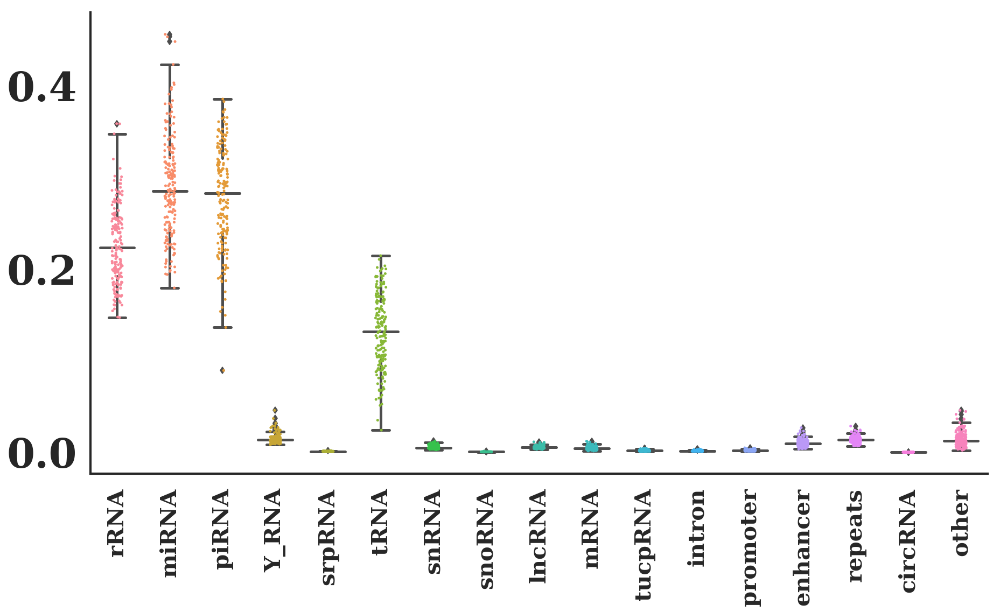

<Figure size 720x480 with 0 Axes>

In [460]:
def plot_ratio_boxplot(data, rnanames, points_show = True, width=20, height=10, savefig=False):
    '''
    data: table_ratio
    rnanames: rna type names
    points_show: plot scatter points too
    '''
    fig, ax = plt.subplots(figsize=(width, height))
    sns.boxplot(data = data,ax=ax,boxprops=dict(alpha=.001),color='gray',width=0.65,saturation=0.01)
    if points_show:
        sns.stripplot(data = data,ax=ax,size=3, edgecolor='black')
    
    ax.set_xticklabels(rnanames,rotation=90)
    #ax.set_yticklabels(['{:.1f}%'.format((i-1)*10) for i in range(10)],fontsize=20,fontweight='bold')
    fig.tight_layout()
    if savefig:
        fig.savefig(plot_save_path+'rna_ratio_box_plot.png', bbox_inches='tight')
    plt.figure(linewidth=30.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)


if sequencing_type == 'short': 
    plot_ratio_boxplot(table_ratio, rnanames, points_show = True, width=16, height=10, savefig=False)
elif sequencing_type == 'long': 
    plot_ratio_boxplot(table_ratio_1, rnanames_1, points_show = True, 
                   width=30, height=10, savefig=False)
    plot_ratio_boxplot(table_ratio_2, rnanames_2, points_show = True, 
                   width=30, height=10, savefig=False)
plt.rc('xtick', labelsize=25)
plt.rc('ytick', labelsize=45) 


## line plot of rna length

In [13]:
def plot_length_line(data, rnanames, width=20, height=50, savefig=False):
    '''
    data: length_table
    rnanames: rna type names
    '''
    length = np.array(data.T)
    fig,ax=plt.subplots(length.shape[0],1,figsize=(width, height))
    for i in range(length.shape[0]):
        ax[i].plot(length[i],label=data.columns[i], color=tableau20[i])
        ax[i].legend(loc='upper right')
        ax[i].set_xticks(np.arange(0, data.shape[0],5))
        ax[i].set_xticklabels(np.arange(data.index[0], data.index[-1],5))
    if savefig:
        fig.savefig(plot_save_path+'rna_length_line_plot.png', bbox_inches='tight')

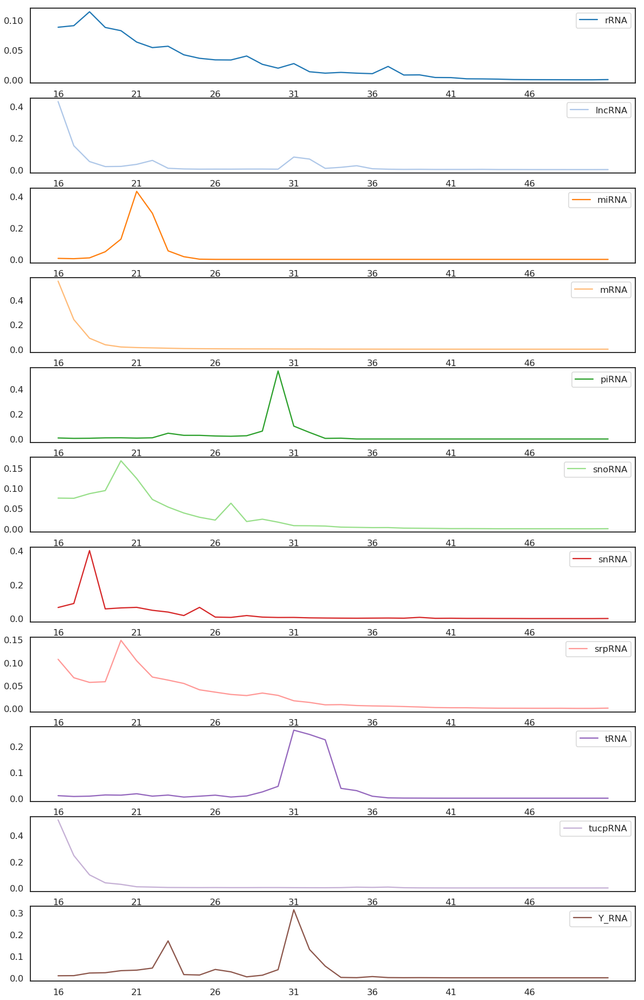

In [14]:
plot_length_line(length_table, rnanames, width=20, height=length_table.shape[1]*3, savefig=False)

## 3D barplot of rna length

In [287]:
def plot_3d(data, width=25, height=16, savefig=False, azim = 45, elev = 32):
    '''
    data: length_table
    '''
    from mpl_toolkits.mplot3d import Axes3D
    fig = plt.figure(figsize=(width,height))
    ax1 = fig.gca(projection="3d")
    num = data.shape[1]
    count_ = data.shape[0]
    xpos = np.repeat(np.arange(1,count_+1),num).reshape(count_,-1).T.ravel()
    ypos = np.repeat(range(num),count_).ravel()
    num_elements = len(xpos)
    zpos = np.zeros(count_*num)
    dx = np.ones(count_*num)/5
    dy = np.ones(count_*num)/5
    dz = np.array(data.T).ravel()
    for i in range(num):
        ax1.bar3d(xpos[count_*i:count_*(i+1)], ypos[count_*i:count_*(i+1)], zpos[count_*i:count_*(i+1)],
                  dx[count_*i:count_*(i+1)], dy[count_*i:count_*(i+1)],dz[count_*i:count_*(i+1)], color=(np.array(tableau20))[:num][i],alpha=0.9)
    plt.xticks(range(count_), [str(i+16) for i in range(count_)], color='red')
    ax1.set_yticks(range(num))
    ax1.set_yticklabels(data.columns, color='blue')
    for color,tick in zip((np.array(tableau20)/float(256))[:num],ax1.yaxis.get_major_ticks()):
        tick.label1.set_color(color)
    ax1.view_init(azim=azim,elev=elev)  
    ax1.xaxis.pane.fill = False
    ax1.yaxis.pane.fill = False
    ax1.zaxis.pane.fill = False
    ax1.xaxis.pane.set_edgecolor('w')
    ax1.yaxis.pane.set_edgecolor('w')
    ax1.zaxis.pane.set_edgecolor('w')
    fig.tight_layout()
    if savefig:
        fig.savefig(plot_save_path+'rna_length_3D_barplot.png', bbox_inches='tight')

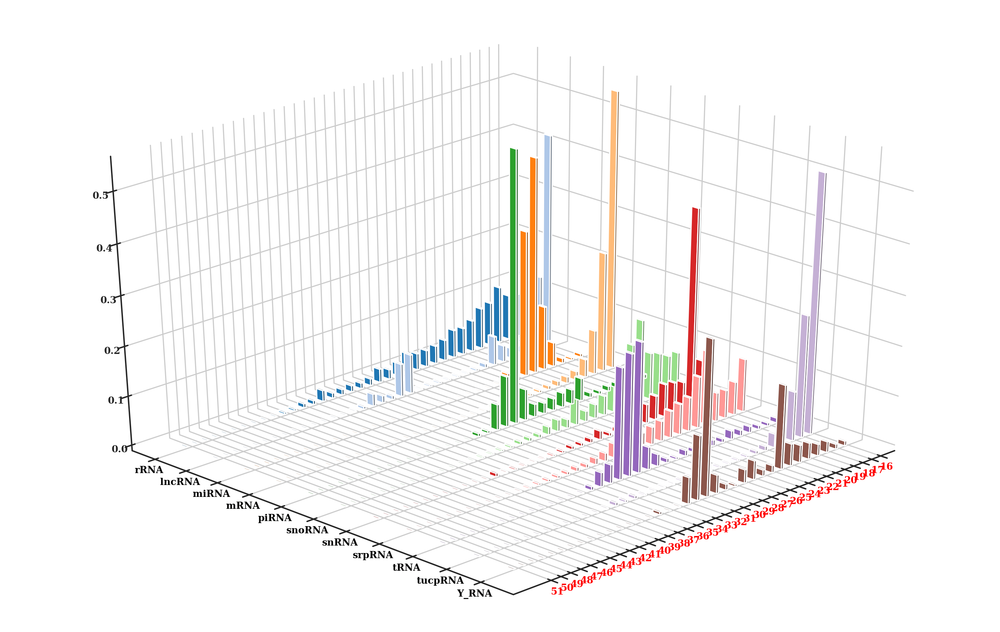

In [288]:
plot_3d(length_table, width=25, height=16, savefig=False, azim = 45, elev = 32)

## stack bar plot of rna counts and ratio

In [275]:
from matplotlib.colors import LinearSegmentedColormap
def stack_bar_ratio(table, statistics = 'ratio',savefig=False):   
    fig,ax=plt.subplots(figsize=(50,10))
    table.plot(kind='bar', stacked=True,ax=ax,width=1,
                legend=True,colormap=matplotlib.colors.ListedColormap ( tableau20))
    ax.legend(bbox_to_anchor=(1,1),fontsize='large')#, loc="lower right",
    #ax.set_title('Stacked Bar plot',fontsize=40)
    if savefig:
        fig.savefig(plot_save_path+statistics+'_stack_barplot.png', bbox_inches='tight')

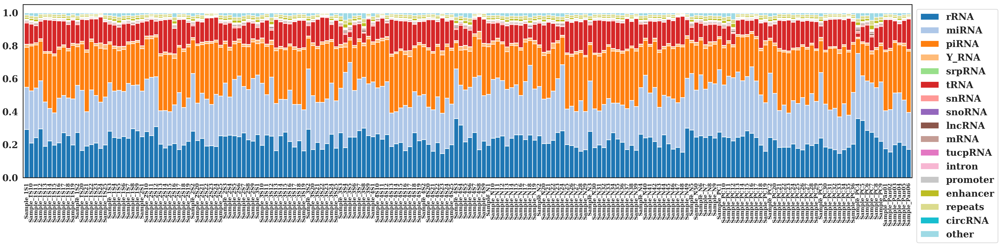

In [276]:
if sequencing_type == 'short': 
    stack_bar_ratio(table_ratio)
elif sequencing_type == 'long': 
    stack_bar_ratio(table_ratio_1)
    stack_bar_ratio(table_ratio_2)

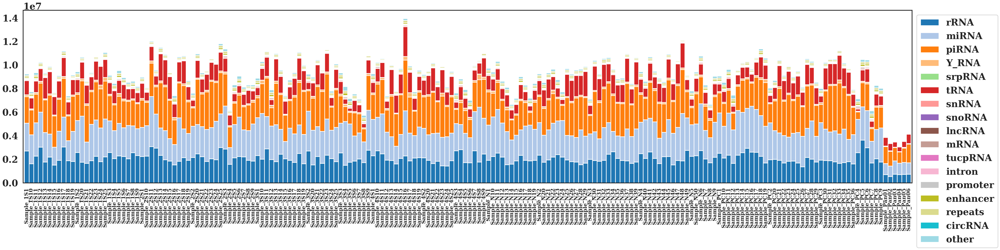

In [277]:
if sequencing_type == 'short': 
    stack_bar_ratio(table_count)
elif sequencing_type == 'long': 
    stack_bar_ratio(table_count_1)
    stack_bar_ratio(table_count_2)

## bar plot of RNA by sample

In [20]:
def plot_bar_by_rna(ax,table,rnaname,savefig=False, statistics = 'ratio',height = 4, width=20):
    '''
    table: ratio or count table, rows are rna type
    statistics: ratio or count
    '''
    table = table.T
    count = np.array(table[table.index ==rnaname]).ravel()
    #fig,ax=plt.subplots(1,figsize=(width,height))
    counttable =  pd.DataFrame(np.concatenate((np.arange(1,table.shape[1]+1).reshape(-1,1),
                count[np.argsort(-count)].reshape(-1,1)),axis=1),columns=['sample',statistics])
    sns.barplot(ax=ax,x='sample',y=statistics,data = counttable,color=tableau20[np.random.randint(0,20)],alpha=1)
    ax.set_xticks(np.arange(0,table.shape[1],5))
    ax.set_xticklabels(np.arange(0,table.shape[1],5))
    ax.set_title(statistics+' of '+rnaname,fontsize=15)
    if savefig:
        fig.savefig(plot_save_path+'sample_'+rnaname+'_'+statistics+'_bar_plot.png', bbox_inches='tight')

In [21]:
def plot_bar_by_rna_total(table,datatype='ratio'):
    fignum= table.columns.shape[0]
    fig,ax=plt.subplots(fignum ,1,figsize=(20 , 4*fignum ))
    for i in range(fignum):
        plot_bar_by_rna(ax[i],table,table.columns[i],statistics = datatype)
    fig.tight_layout() 

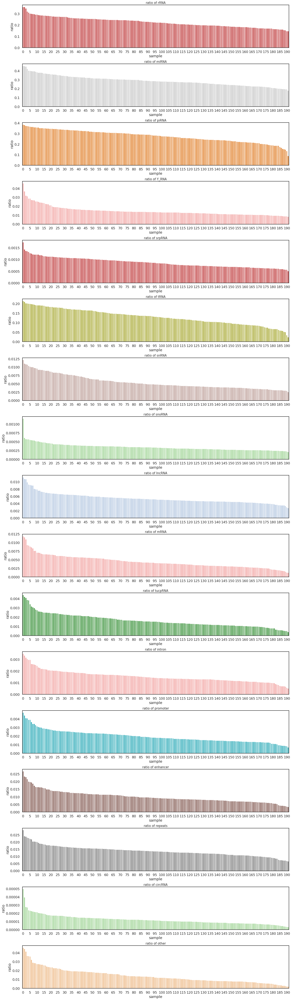

In [22]:
if sequencing_type == 'short': 
    plot_bar_by_rna_total(table_ratio,datatype='ratio')
elif sequencing_type == 'long': 
    plot_bar_by_rna_total(table_ratio_1,datatype='ratio')
    plot_bar_by_rna_total(table_ratio_2,datatype='ratio')

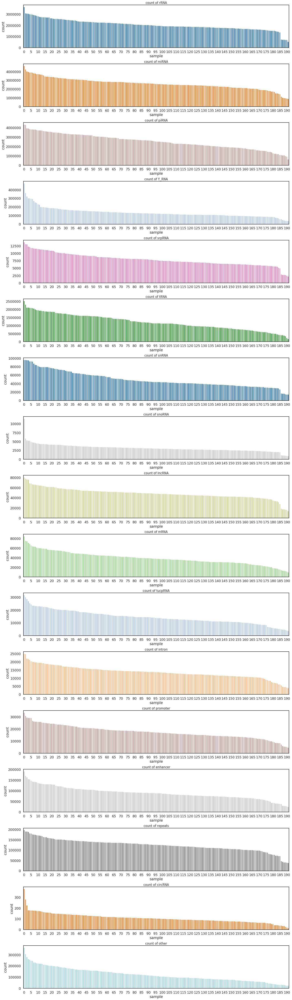

In [23]:
if sequencing_type == 'short': 
    plot_bar_by_rna_total(table_count,datatype='count')
elif sequencing_type == 'long': 
    plot_bar_by_rna_total(table_count_1,datatype='count')
    plot_bar_by_rna_total(table_count_2,datatype='count')

## bar plot of domains combined by RNA type

In [232]:
domain_matrix =pd.read_table('output/'+dataset+'/count_matrix/'+exp_mx_name+'.txt',index_col=0)
domain_index = np.array(domain_matrix.index)

In [47]:
domain_type = np.array([domain_index[i].split('|')[1] for i in range(domain_index.shape[0])]) 

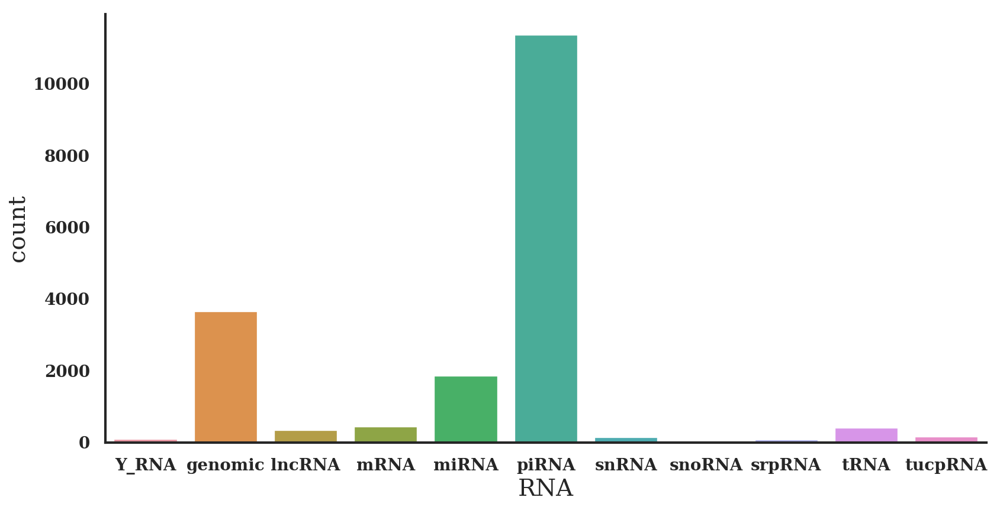

<Figure size 720x480 with 0 Axes>

In [66]:
domain_type_table = pd.DataFrame(np.concatenate((np.unique(domain_type,return_counts=True)[1].reshape(-1,1),
             np.unique(domain_type,return_counts=True)[0].reshape(-1,1)),axis=1))
domain_type_table.columns = ['count','RNA']
domain_type_table.iloc[:,0] = pd.to_numeric(domain_type_table.iloc[:,0])

fig, ax = plt.subplots(1,figsize=(16, 8))
sns.barplot(ax=ax,data=domain_type_table,x='RNA',y='count')
plt.figure(linewidth=30.5)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

## FastQC

In [24]:
summary = pd.read_table('output/'+dataset+'/summary/fastqc.txt', sep='\t')
qc_status = summary.iloc[:, 9:]
qc_status.fillna('NA')
qc_status = qc_status.astype('str')
sample_ids = summary.sample_id
sections = qc_status.columns.values
def style_func(val):
    status, row, col = val.split('|')
    row, col = int(row), int(col)
    color = {'pass': 'green', 'fail': 'red', 'warn': 'orange'}.get(status, 'gray')
    return '<a href="../output/'+dataset+'/fastqc/{sample_id}_fastqc.html#M{section}" style="color: {color}">{status}</a>'.format(
        sample_id=sample_ids[row], color=color, status=status, section=col + 1)

pd.DataFrame(qc_status.values \
             + '|' + np.arange(qc_status.shape[0]).astype('str')[:, np.newaxis] \
             + '|' + np.arange(qc_status.shape[1]).astype('str')[np.newaxis, :],
             index=qc_status.index, columns=qc_status.columns) \
    .style.format(style_func)

,Basic Statistics,Per base sequence quality,Per tile sequence quality,Per sequence quality scores,Per base sequence content,Per sequence GC content,Per base N content,Sequence Length Distribution,Sequence Duplication Levels,Overrepresented sequences,Adapter Content,Kmer Content
0,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan
1,pass,pass,fail,pass,fail,fail,pass,pass,fail,fail,fail,nan
2,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan
3,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,fail
4,pass,pass,fail,pass,fail,fail,pass,pass,fail,fail,fail,nan
5,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan
6,pass,pass,pass,pass,fail,fail,pass,pass,fail,fail,fail,fail
7,pass,pass,fail,pass,fail,fail,pass,pass,fail,fail,fail,nan
8,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan
9,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan


## Sample QC
use PCA and tSNE to visualize outliters

In [237]:
original_mx_file = 'output/'+dataset+'/count_matrix/'+exp_mx_name+'.txt'
original_mx = pd.read_table(original_mx_file,index_col=0)

In [26]:
def PCA_plot_basic(ax,data,method_PCA = True):
    X = np.log2(data + 0.001).T
    X = StandardScaler().fit_transform(X)
    if method_PCA == True:
        transform = PCA()
    else:
        transform = TSNE()
    X_pca = transform.fit_transform(X)
    ax.scatter(X_pca[:,0], X_pca[:,1], s=200,alpha=0.8 ,edgecolors = 'b',color='r')
def sample_qc_visualize_outlier(original_mx,table_ratio,method='PCA'):
    fig, ax = plt.subplots(1,2,figsize=(16, 8))
    if method=='PCA':
        method_PCA = True
    elif method=='tSNE':
        method_PCA = False
    PCA_plot_basic(ax[0],original_mx, method_PCA)
    PCA_plot_basic(ax[1],table_ratio, method_PCA)

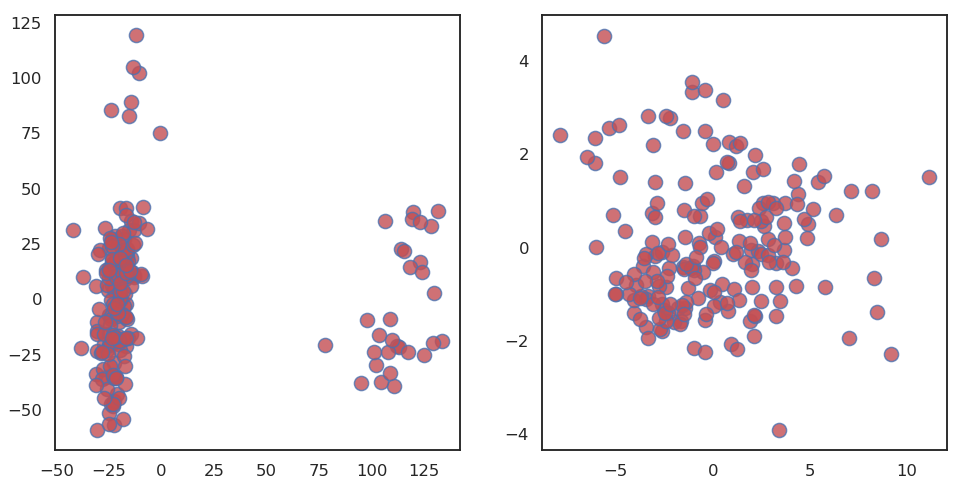

In [27]:
sample_qc_visualize_outlier(original_mx,table_ratio.T,method='PCA')

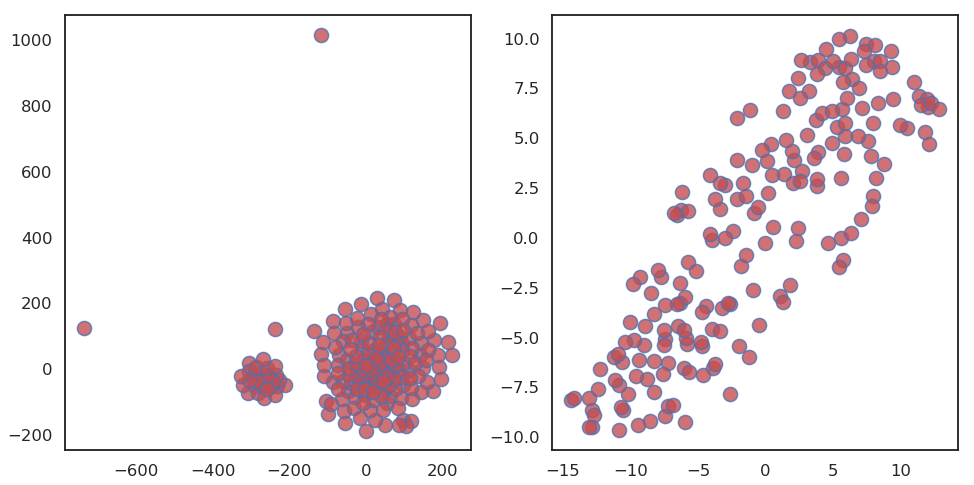

In [28]:
sample_qc_visualize_outlier(original_mx,table_ratio.T,method='tSNE')

# Matrix processing

## filtering effect

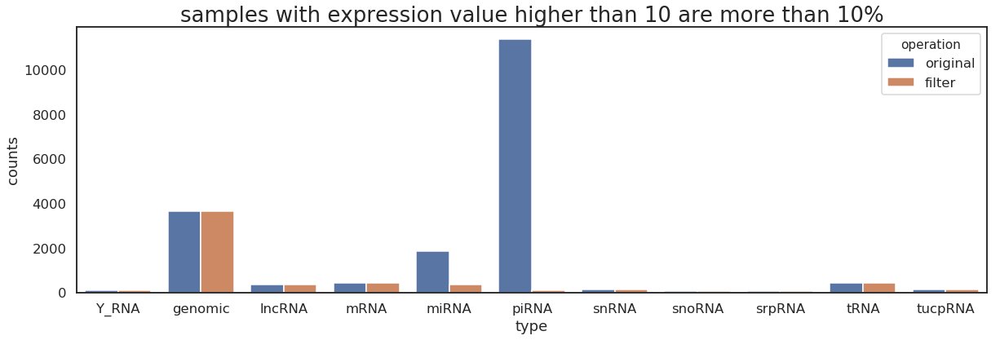

In [29]:
def plot_bar_for_filter(expression_mx,cutoff_ratio = 0.2,counts_threshold = 10 ):
    retain_index = np.where(np.sum(expression_mx > counts_threshold,axis=1) >=round(cutoff_ratio*expression_mx.shape[1]))[0]
    filter_mx = expression_mx.iloc[retain_index,:]
    names = expression_mx.index
    names_ = filter_mx.index
    names_type = np.array([names[i].split('|')[1] for i in range(names.shape[0])])
    type_counts = np.unique(names_type, return_counts = True)
    names_type_ = np.array([names_[i].split('|')[1] for i in range(names_.shape[0])])
    type_counts_ = np.unique(names_type_, return_counts = True)
    typedataframe = pd.DataFrame(np.concatenate((type_counts[0].reshape(-1,1),type_counts[1].reshape(-1,1)),axis=1))
    typedataframe.columns = ['type','counts']
    typedataframe_ = pd.DataFrame(np.concatenate((type_counts_[0].reshape(-1,1),type_counts_[1].reshape(-1,1)),axis=1))
    typedataframe_.columns = ['type','counts']
    typedataframe.counts = pd.to_numeric(typedataframe.counts)
    typedataframe_.counts = pd.to_numeric(typedataframe_.counts)
    dataall = pd.concat((typedataframe,typedataframe_))
    operation = np.concatenate((np.repeat('original',typedataframe.shape[0]),
                                           np.repeat('filter',typedataframe.shape[0])))

    dataall['operation'] = operation
    fig,ax=plt.subplots(1,figsize=(20 , 6))
    sns.barplot(ax=ax,data=dataall,x='type',y='counts',hue='operation')
    ax.set_title('samples with expression value higher than '+str(counts_threshold) +
                    ' are more than '+str(round(cutoff_ratio*100))+'%',fontsize=26)
plot_bar_for_filter(original_mx,cutoff_ratio = 0.1 ,counts_threshold = 10 )

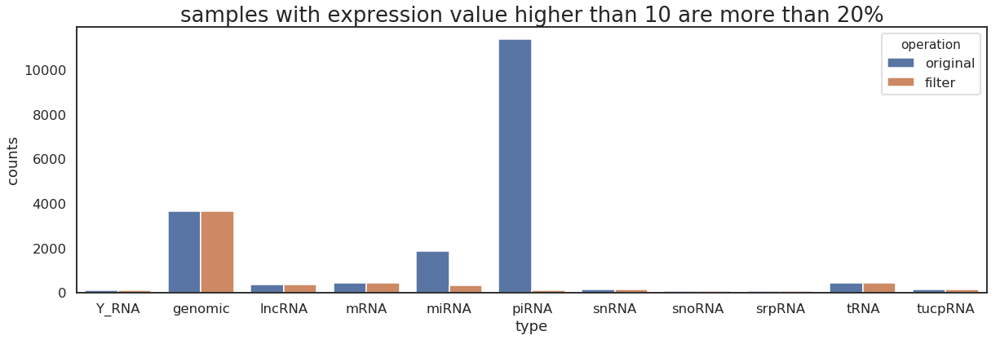

In [30]:
plot_bar_for_filter(original_mx,cutoff_ratio = 0.2 ,counts_threshold = 10 )

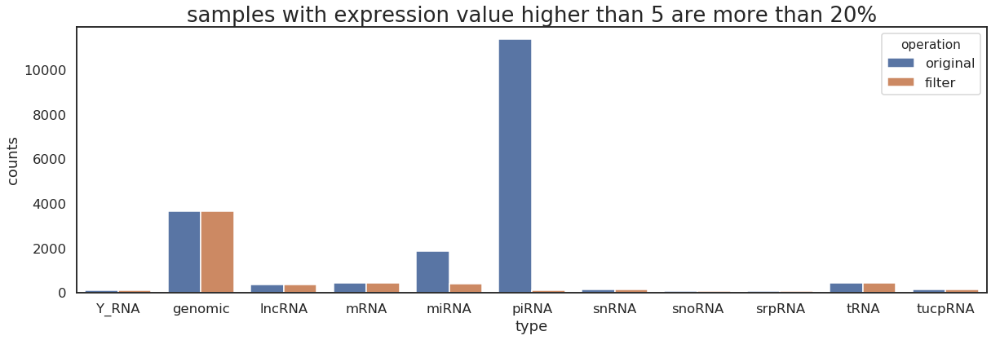

In [31]:
plot_bar_for_filter(original_mx,cutoff_ratio = 0.2 ,counts_threshold = 5 )

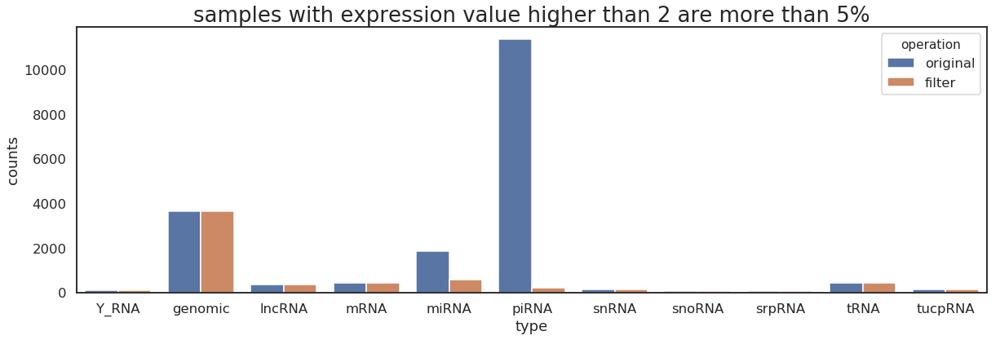

In [32]:
plot_bar_for_filter(original_mx,cutoff_ratio = 0.05 ,counts_threshold = 2 )

In [241]:
matrix_processing_path = 'output/'+dataset+'/matrix_processing/'
imputation_method = 'scimpute_count'
normalization_method = 'Norm_SCnorm'
batch_removal_method = 'Batch_RUV'
batch_index = 'null'
class_info = 'data/'+dataset+'/sample_classes.txt'
batch_info = 'data/'+dataset+'/batch_info.txt'
original_mx_file = 'output/'+dataset+'/count_matrix/'+exp_mx_name+'.txt'

def null_name(string):
    if string =='null':
        return '.null'
    else:
        return '.'+string
    
def generate_processed_filename(original_mx_file,imputation_method,normalization_method,batch_removal_method,batch_index): 
    imputename = null_name(imputation_method)
    normname = null_name(normalization_method)
    batchname = null_name(batch_removal_method)
    if batch_index=='null':
        batchindname = ''
    else:
        batchindname = '_'+batch_index
    return'filter'+imputename+normname+batchname+batchindname+'.'+original_mx_file.split('/')[-1]

original_mx = pd.read_table(original_mx_file,index_col=0)
processed_mx = pd.read_table(matrix_processing_path+generate_processed_filename(\
            original_mx_file,imputation_method,normalization_method,batch_removal_method,batch_index),index_col=0)
sample_class = pd.read_table(class_info,sep='\t',index_col=0)
batchtable = pd.read_table(batch_info,sep='\t',index_col=0)


## relative log expression

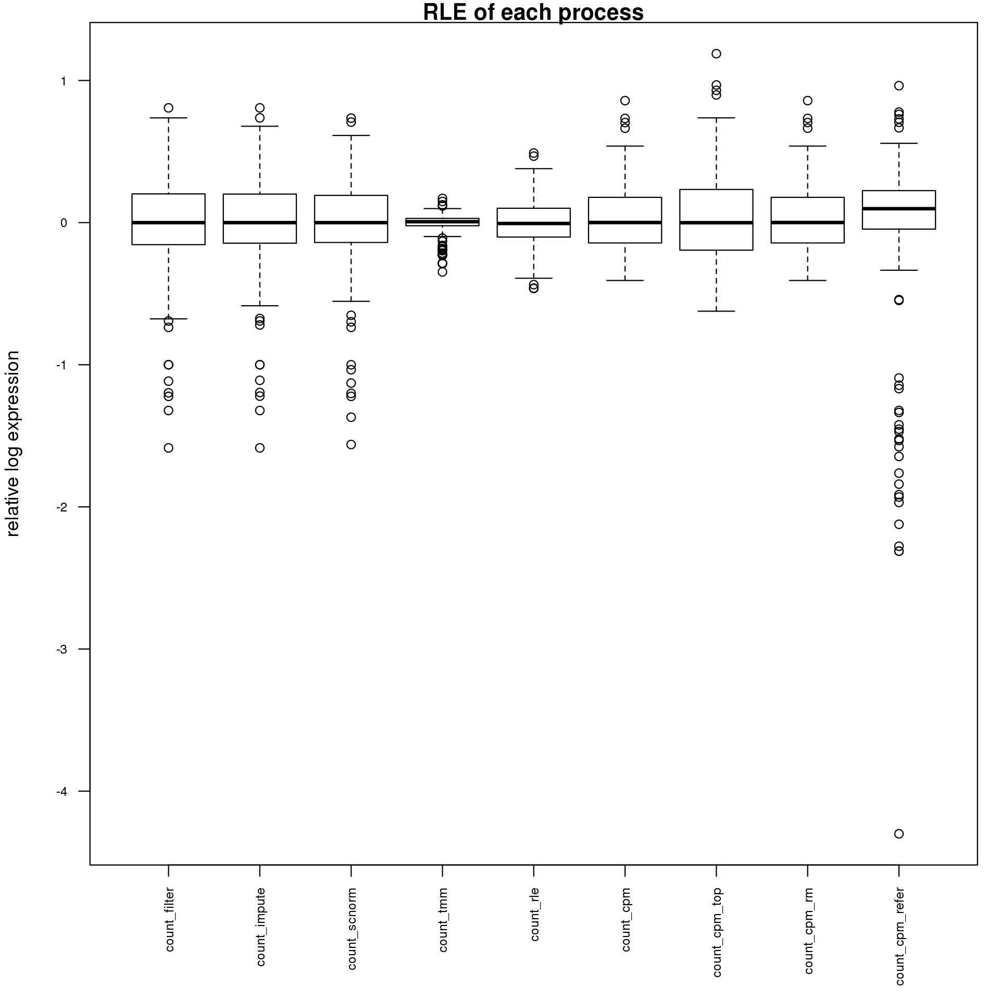

In [35]:
Image(filename='/home/xieyufeng/exSeek/pdf/RLE.png') 

## expression vs read depth

'cpm_top_count_depth'

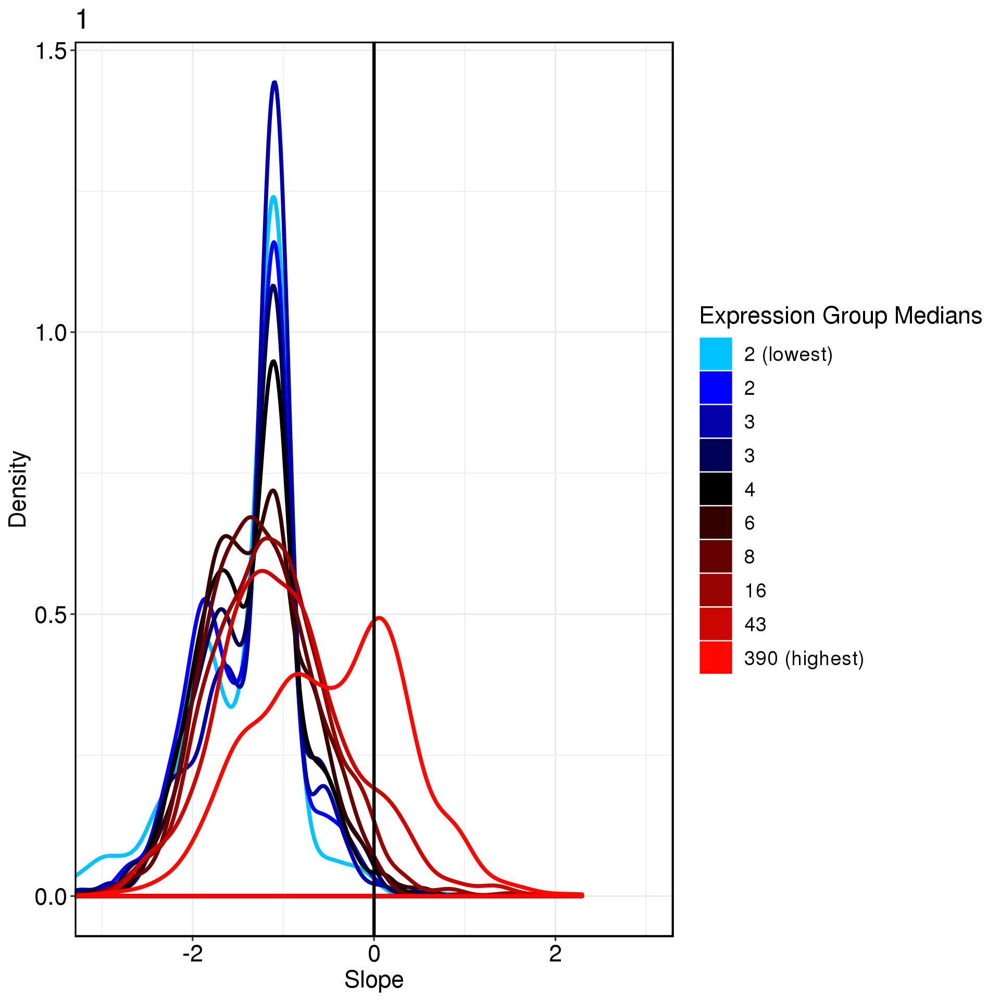

'cpm_refer_count_depth'

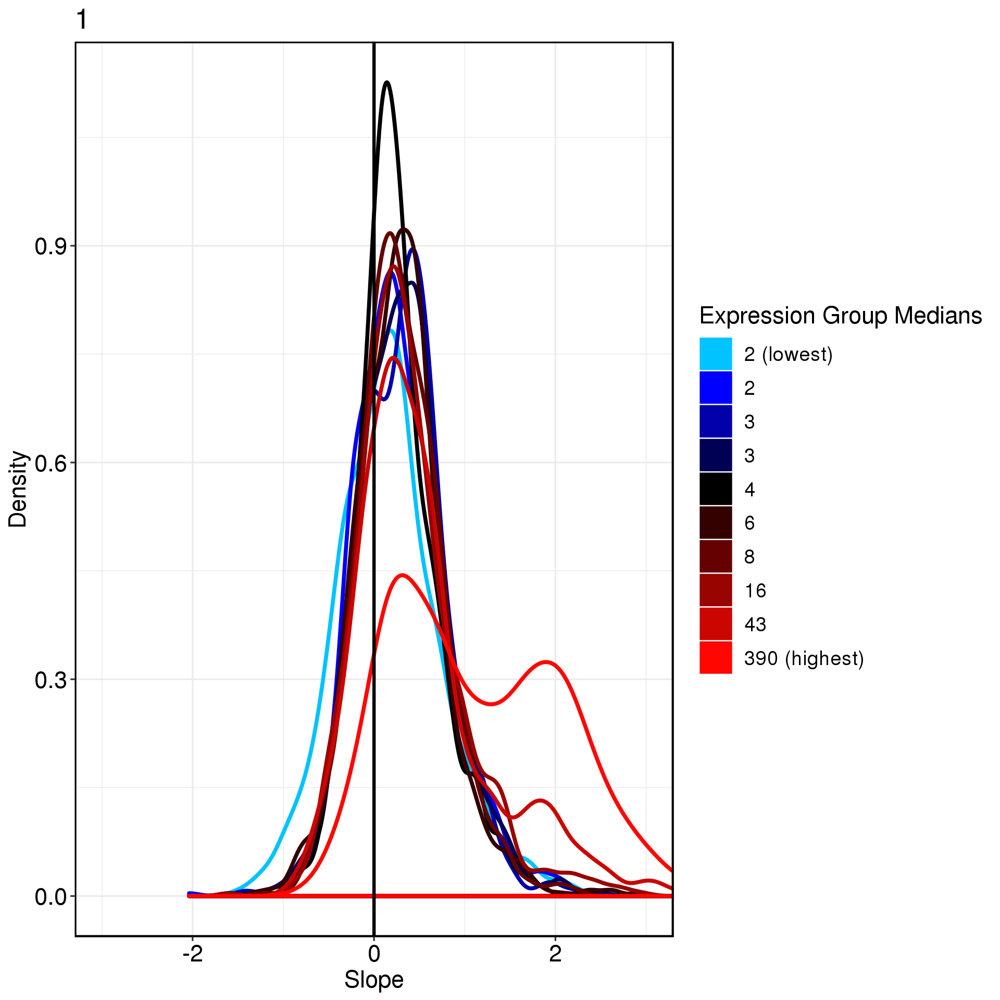

'rle_count_depth'

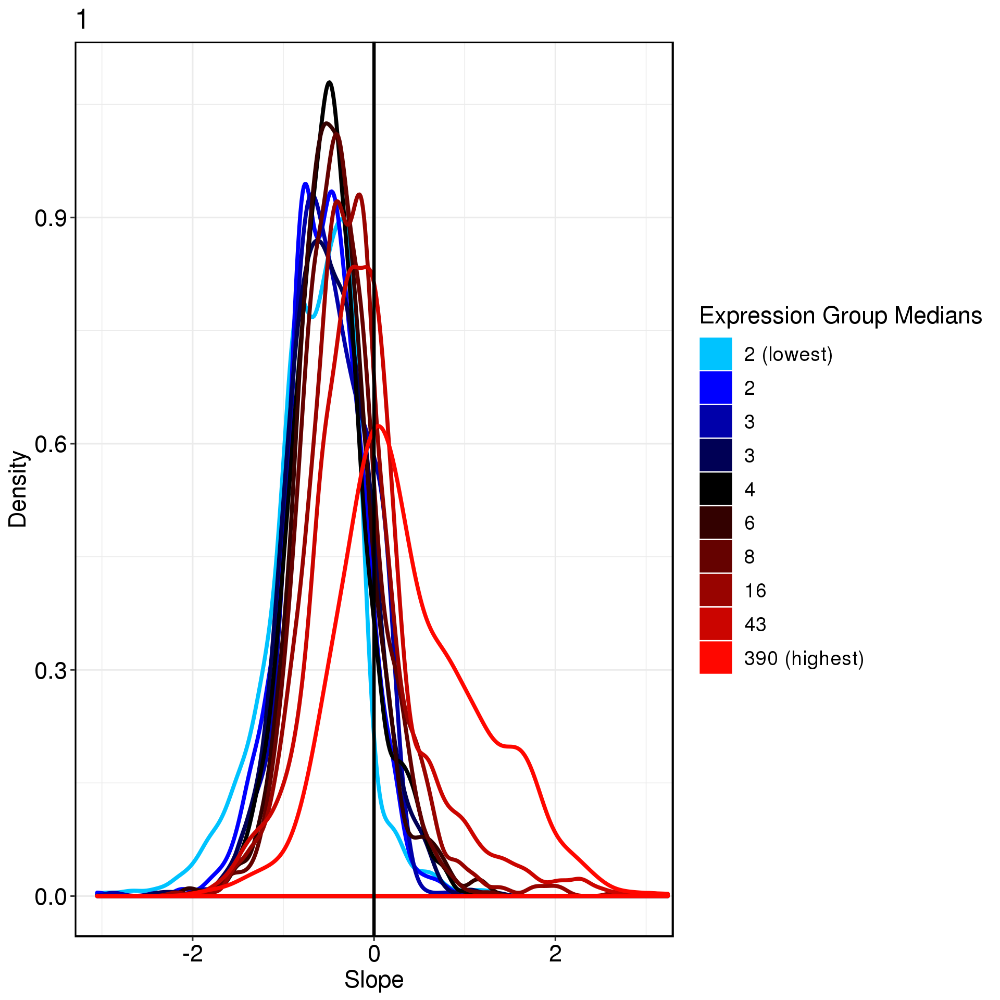

'cpm_count_depth'

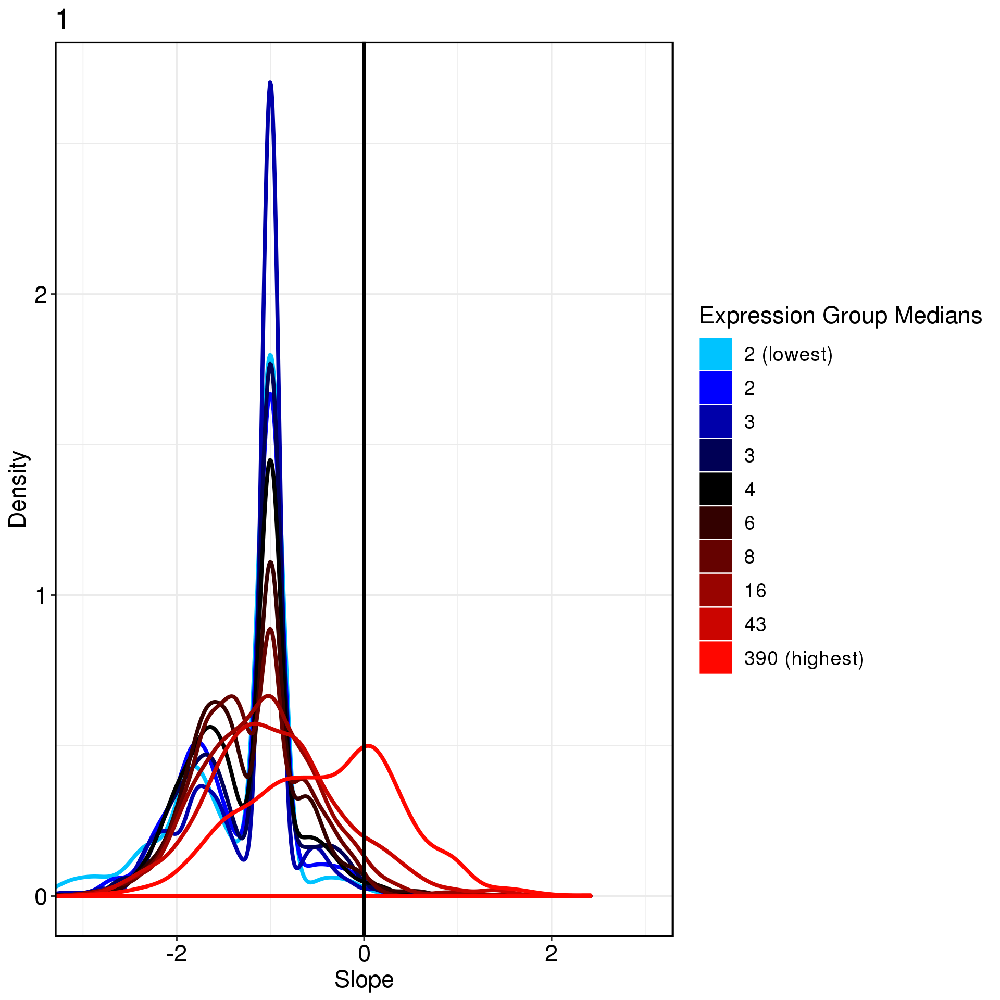

'cpm_rm_count_depth'

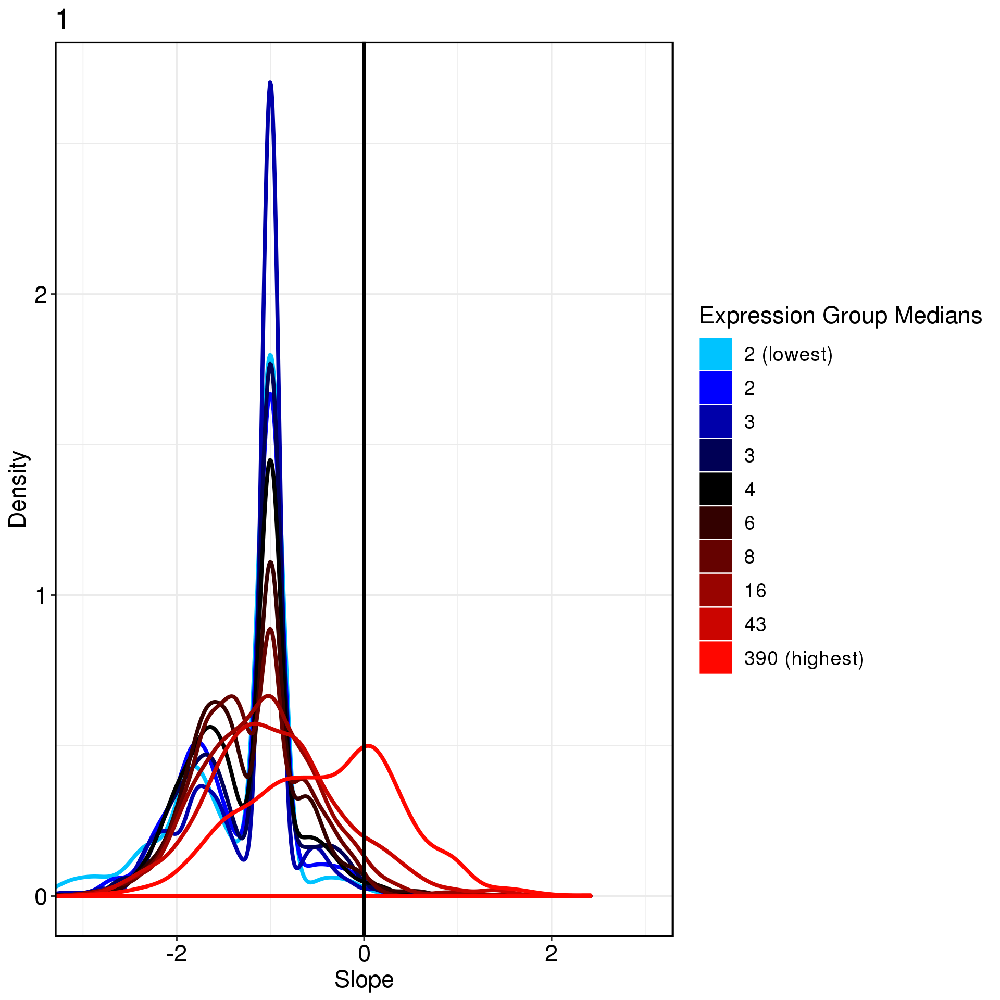

'impute_count_depth'

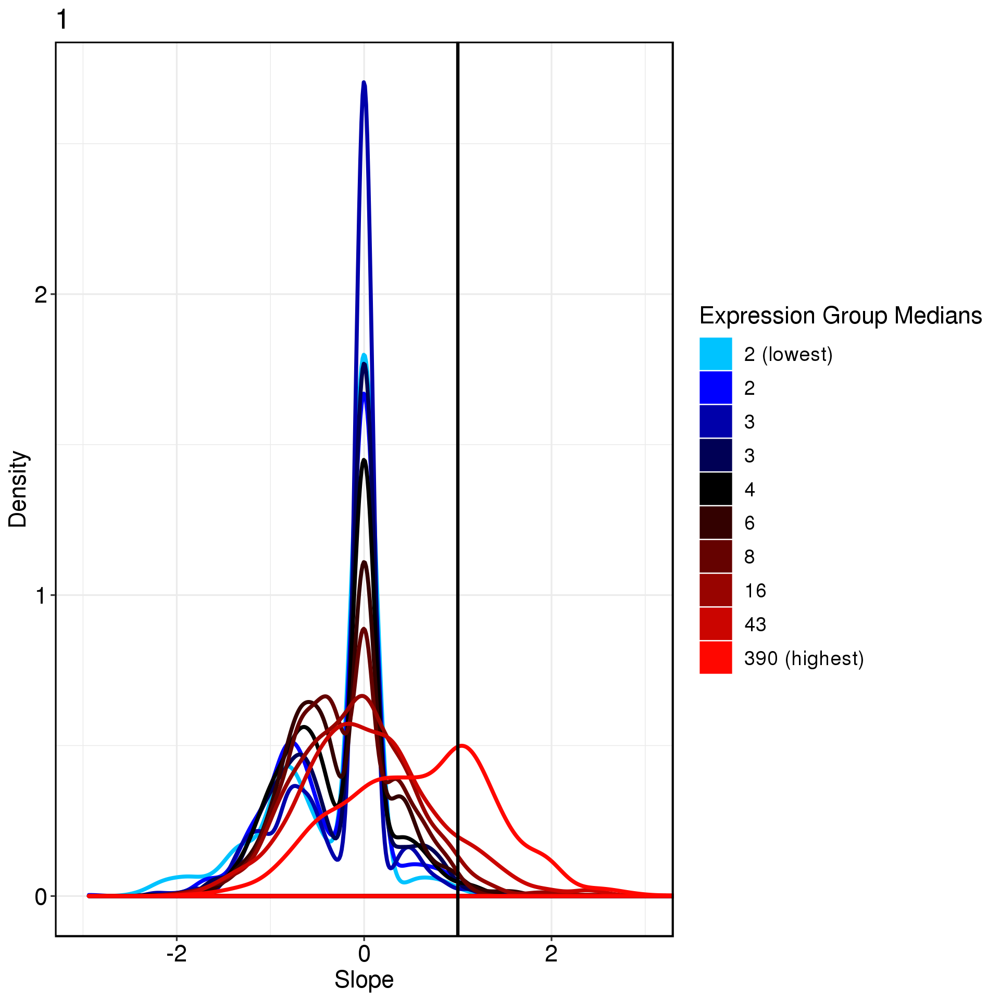

'tmm_count_depth'

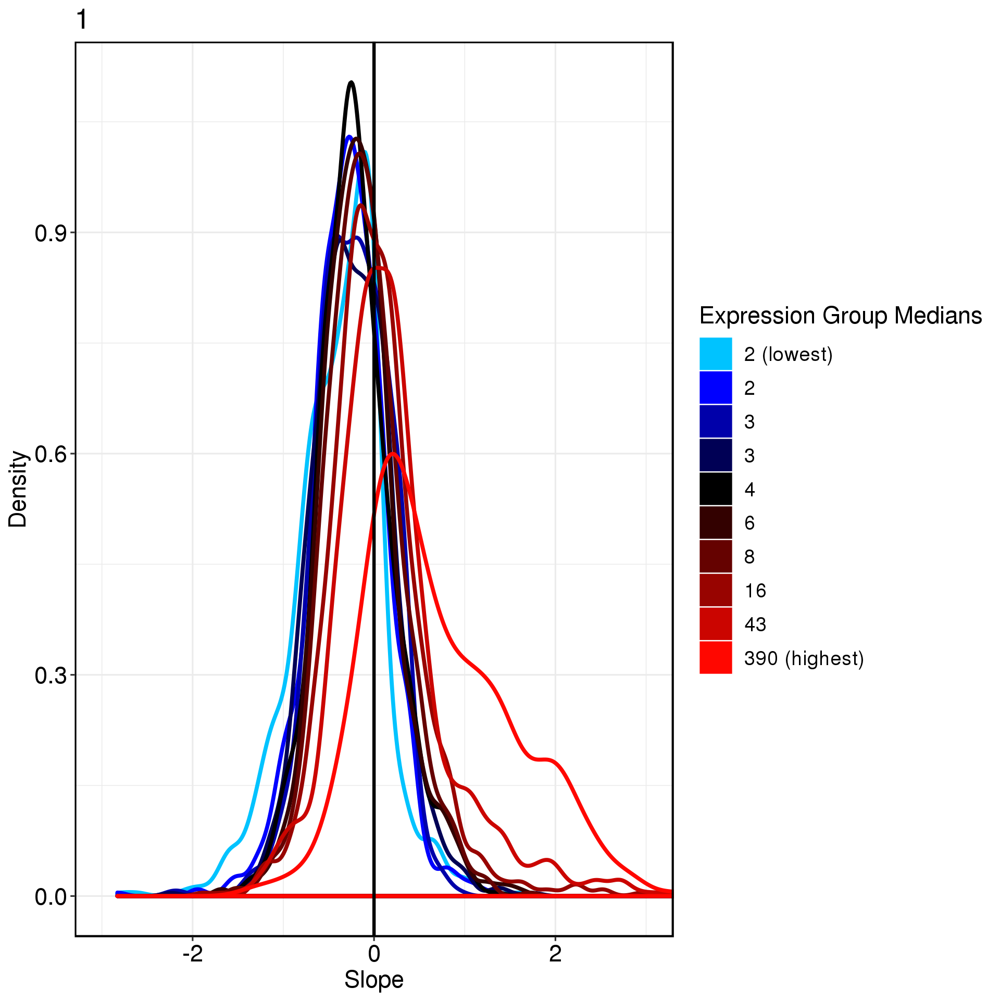

'scnorm_count_depth'

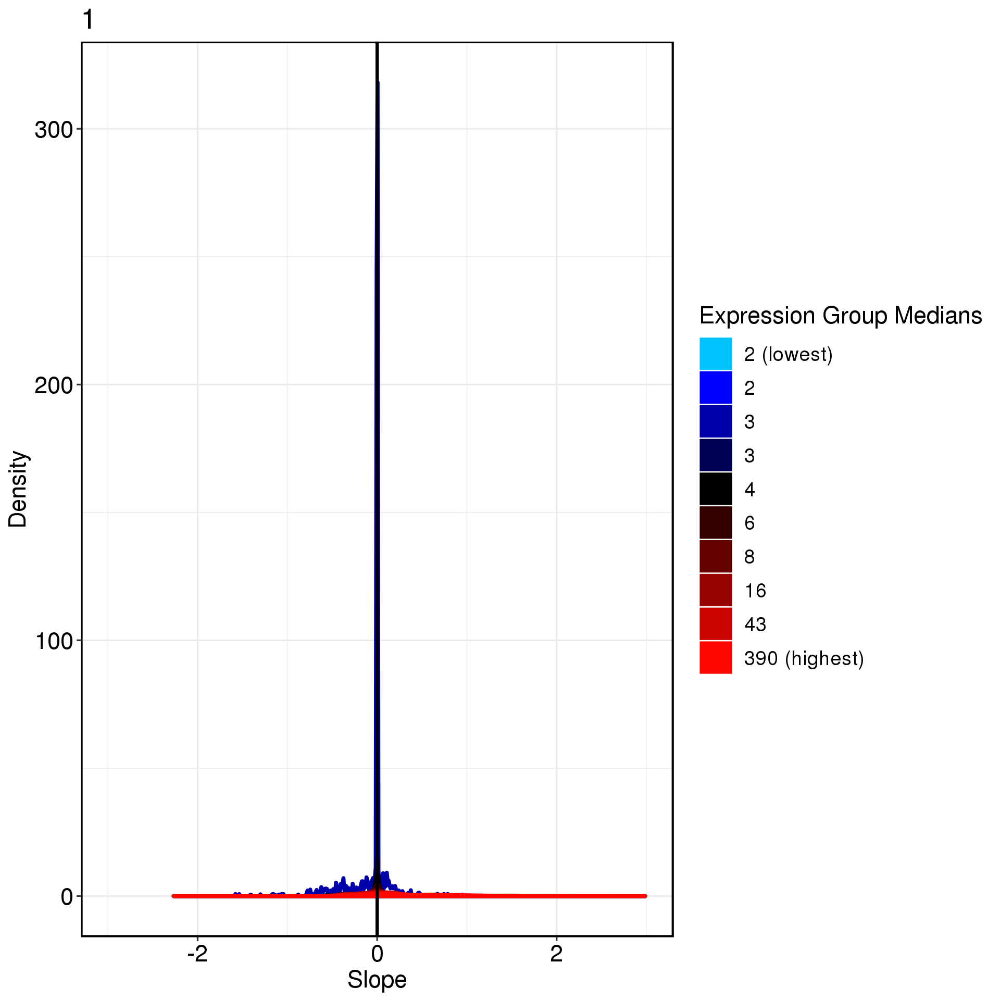

In [36]:
files = os.listdir('/home/xieyufeng/exSeek/pdf/')
selected_files = list(filter(lambda x: x.startswith('mat_'),files))
for i in selected_files:
    display (i.split('.')[0][4:])
    display(Image(filename='/home/xieyufeng/exSeek/pdf/'+i))

## PCA, tSNE and UMAP

In [37]:
def alignment_score(X, y, K=10):
    N = X.shape[0]
    nn = NearestNeighbors(K)
    nn.fit(X)
    distances, indices = nn.kneighbors(X, K + 1)
    neighbor_classes = np.take(y, indices[:, 1:])
    same_class_fractions = np.sum(neighbor_classes == y[:, np.newaxis], axis=1)
    score = 1.0 - (np.mean(same_class_fractions) - K/N)/(K - K/N)
    print (same_class_fractions.shape,np.mean(same_class_fractions),K/N,neighbor_classes)
    return score,


In [469]:
def knn_score(X, y, K=10):
    N = X.shape[0]
    assert K < N
    nn = NearestNeighbors(K)
    nn.fit(X)
    distances, indices = nn.kneighbors(X, K + 1)
    neighbor_classes = np.take(y, indices[:, 1:])
    same_class_fractions = np.sum(neighbor_classes == y[:, np.newaxis], axis=1)
    classes, counts = np.unique(y, return_counts=True)
    classes = np.argmax(y.reshape((-1, 1)) == classes.reshape((1, -1)), axis=1)
    counts = np.take(counts, classes)
    mean_r = K/(N - 1)*counts
    max_r = np.minimum(K, counts)
    #print (same_class_fractions.shape,mean_r.shape,max_r.shape)
    #scores = (np.mean(same_class_fractions) - mean_r)/(max_r - mean_r)
    scores = (same_class_fractions - mean_r)/(max_r - mean_r)
    #print(scores)
    return scores.mean()
def convert_label_to_int(sample_class):
    classes, counts = np.unique(sample_class, return_counts=True)
    classes = np.argmax(sample_class.reshape((-1, 1)) == classes.reshape((1, -1)), axis=1)
    return classes
def unsupervised_clustering_accuracy(y, y_pred):
    """
    Unsupervised Clustering Accuracy
    """
    from sklearn.utils.linear_assignment_ import linear_assignment
    assert len(y_pred) == len(y)
    u = np.unique(np.concatenate((y, y_pred)))
    n_clusters = len(u)
    mapping = dict(zip(u, range(n_clusters)))
    reward_matrix = np.zeros((n_clusters, n_clusters), dtype=np.int64)
    for y_pred_, y_ in zip(y_pred, y):
        if y_ in mapping:
            reward_matrix[mapping[y_pred_], mapping[y_]] += 1
    cost_matrix = reward_matrix.max() - reward_matrix
    ind = linear_assignment(cost_matrix)
    return sum([reward_matrix[i, j] for i, j in ind]) * 1.0 / y_pred.size, ind
def clustering_scores(X,y, prediction_algorithm='knn'):
    from sklearn.metrics import adjusted_rand_score as ARI
    from sklearn.metrics import normalized_mutual_info_score as NMI
    from sklearn.metrics import silhouette_score
    from sklearn.mixture import GaussianMixture as GMM
    from sklearn.cluster import KMeans
    
    cluster_num = np.unique(y).shape[0]
    if prediction_algorithm == 'knn':
        labels_pred = KMeans(cluster_num, n_init=200).fit_predict(X)  
    elif prediction_algorithm == 'gmm':
        gmm = GMM(cluster_num)
        gmm.fit(X)
        labels_pred = gmm.predict(X)
    labels = y
    asw_score = silhouette_score(X, labels)
    nmi_score = NMI(labels, labels_pred)
    ari_score = ARI(labels, labels_pred)
    labels_int = convert_label_to_int(labels)
    uca_score = unsupervised_clustering_accuracy(labels_int, labels_pred)[0]
    return asw_score, nmi_score, ari_score, uca_score

def uca_scores(X,y, prediction_algorithm='knn'):
    from sklearn.cluster import KMeans
    
    cluster_num = np.unique(y).shape[0]
    if prediction_algorithm == 'knn':
        labels_pred = KMeans(cluster_num, n_init=200).fit_predict(X)  
    elif prediction_algorithm == 'gmm':
        gmm = GMM(cluster_num)
        gmm.fit(X)
        labels_pred = gmm.predict(X)
    labels = y
    labels_int = convert_label_to_int(labels)
    uca_score = unsupervised_clustering_accuracy(labels_int, labels_pred)[0]
    return uca_score

def get_clustering_score(data,sampleclass,method = 'PCA',prediction_algorithm='knn'):
    X = np.log2(data + 0.001).T
    X = StandardScaler().fit_transform(X)
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')
    
    #X_pca = transform.fit_transform(X)
    X_, y_ = X, sampleclass.loc[data.columns.values].values.ravel() 
    #knn_score_ = knn_score(X_, y_)
    #asw_score, nmi_score, ari_score, uca_score = clustering_scores(X_, y_, prediction_algorithm)
    uca_score = uca_scores(X_, y_, prediction_algorithm)
    return uca_score

## plot UCA score of different methods

In [410]:
uca_summary = pd.read_table('output/'+dataset+'/select_preprocess_method/uca_score/'+exp_mx_name+'/summary.txt',
                           index_col=0)
                            

In [425]:
uca_summary_table = pd.DataFrame(np.ndarray([uca_summary.shape[0],4]))
uca_summary_table.columns = ['imputation','normalization','batch_removal','uca_score']
for i in range(uca_summary.shape[0]):
    splittmp = uca_summary.index[i].split('.')
    uca_summary_table.iloc[i,0] = splittmp[1]
    uca_summary_table.iloc[i,1] = splittmp[2]
    uca_summary_table.iloc[i,2] = splittmp[3]
    uca_summary_table.iloc[i,3] = uca_summary.values[i]

In [445]:
display(uca_summary_table.groupby(uca_summary_table.columns[0]).mean())
display(uca_summary_table.groupby(uca_summary_table.columns[1]).mean())
display(uca_summary_table.groupby(uca_summary_table.columns[2]).mean())
uca_mean_summary = pd.concat((uca_summary_table.groupby(uca_summary_table.columns[0]).mean(),
          uca_summary_table.groupby(uca_summary_table.columns[1]).mean(),
          uca_summary_table.groupby(uca_summary_table.columns[2]).mean()))
uca_mean_summary =  uca_mean_summary.rename(index={'null': 'imputation_null'})

,uca_score
imputation,
null,0.379762
scimpute_count,0.379613
viper_count,0.376935


,uca_score
normalization,
Norm_CPM,0.375694
Norm_CPM_rm,0.370833
Norm_CPM_top,0.370139
Norm_RLE,0.378819
Norm_SCnorm,0.388889
Norm_TMM,0.372569
Norm_null,0.394444


,uca_score
batch_removal,
Batch_Combat_1,0.349454
Batch_Combat_2,0.371776
Batch_Combat_3,0.352679
Batch_RUV,0.443948
Batch_null,0.375992


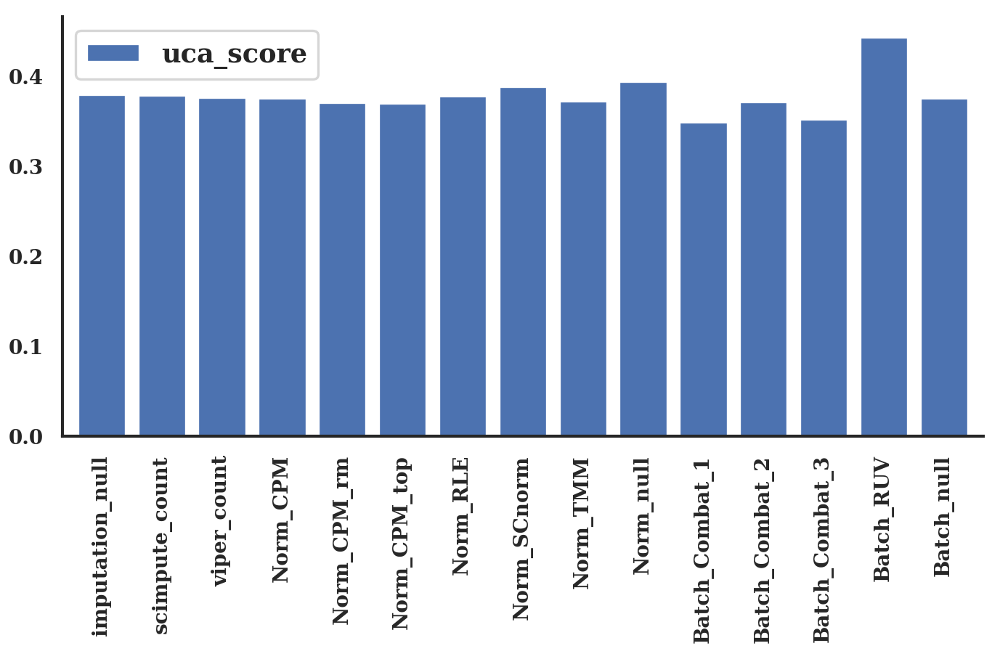

<Figure size 720x480 with 0 Axes>

In [455]:
fig, ax = plt.subplots(1,figsize=(12, 8))
uca_mean_summary.plot(kind='bar',ax=ax,width=0.8,
                legend=True)
fig.tight_layout()
plt.figure(linewidth=30.5)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

[Text(0,0,'imputation_null'),
 Text(1,0,'scimpute_count'),
 Text(2,0,'viper_count'),
 Text(3,0,'Norm_CPM'),
 Text(4,0,'Norm_CPM_rm'),
 Text(5,0,'Norm_CPM_top'),
 Text(6,0,'Norm_RLE'),
 Text(7,0,'Norm_SCnorm'),
 Text(8,0,'Norm_TMM'),
 Text(9,0,'Norm_null'),
 Text(10,0,'Batch_Combat_1'),
 Text(11,0,'Batch_Combat_2'),
 Text(12,0,'Batch_Combat_3'),
 Text(13,0,'Batch_RUV'),
 Text(14,0,'Batch_null')]

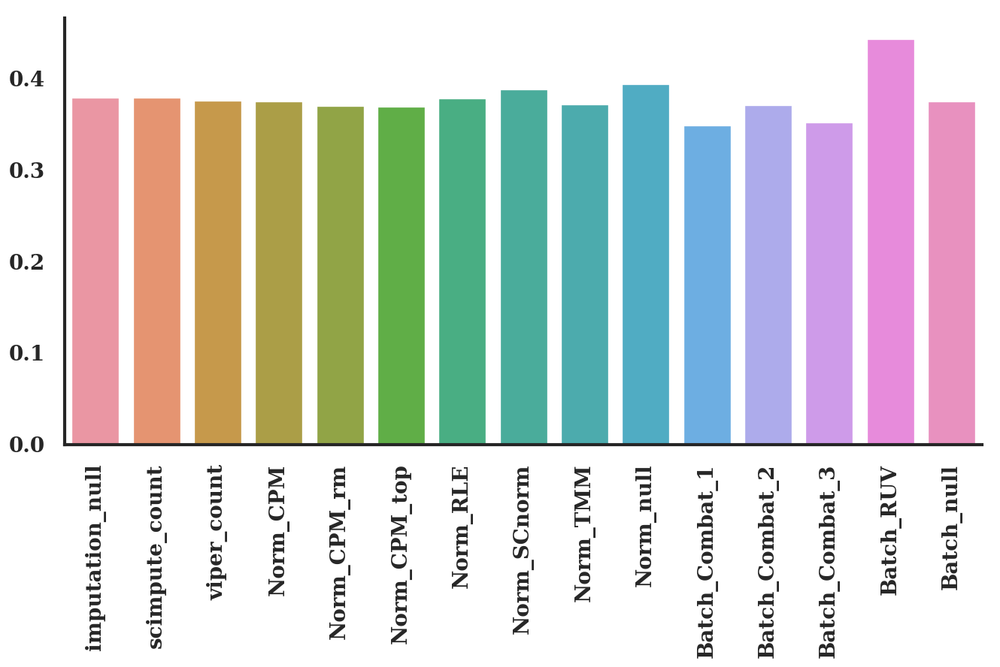

<Figure size 720x480 with 0 Axes>

In [459]:
fig, ax = plt.subplots(1,figsize=(12, 6))
sns.barplot(data=uca_mean_summary.T)
fig.tight_layout()
plt.figure(linewidth=30.5)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xticklabels(uca_mean_summary.index,rotation=90)

In [357]:
get_clustering_score(original_mx,sample_class)

0.4114583333333333

In [358]:
get_clustering_score(processed_mx,sample_class)

0.4270833333333333

In [468]:
def PCA_plot_with_uca_score(ax,data,sampleclass,method = 'PCA'):
    X = np.log2(data + 0.001).T
    X = StandardScaler().fit_transform(X)
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')
    
    X_pca = transform.fit_transform(X)
    class_name = np.unique(sampleclass.label)
    
    for label, color in zip(class_name, 
                                tableau20[:class_name.shape[0]]):
        indices = np.nonzero(sampleclass.loc[data.columns].label == label)[0]
        ax.scatter(X_pca[indices, 0], X_pca[indices, 1], s=200,alpha=1 ,edgecolors = 'black',label=label)
    ax.legend(fontsize=10)
    plt.figure(linewidth=30.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    uca_score = get_clustering_score(data, sampleclass)
    ax.set_title('UCA score: {:.6f}'.format(uca_score))
    #print('Alignment score: {}'.format(knn_score(X_pca, sampleclass.loc[data.columns.values].values.ravel() )))
    return uca_score

In [560]:
def PCA_plot_with_uca_score_sns(ax,data,sampleclass,method = 'PCA'):
    X = np.log2(data + 0.001).T
    X = StandardScaler().fit_transform(X)
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')
    
    X_pca = transform.fit_transform(X)
    plot_table = pd.DataFrame(X_pca[:,:2])
    plot_table.index = data.columns
    plot_table = pd.concat((plot_table,sampleclass.loc[plot_table.index]),axis=1)
    plot_table.columns = ['dimension_1','dimension_2','class']
    classnum = np.unique(plot_table.iloc[:,2]).shape[0]
    sns.scatterplot(ax=ax,data=plot_table,x="dimension_1", y="dimension_2",
                    palette=np.array(Category20c[20]).reshape(4,-1).T.ravel()[:classnum],hue="class",s=600)
    plt.figure(linewidth=30.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    uca_score = get_clustering_score(data, sampleclass)
    ax.set_title('UCA score: {:.6f}'.format(uca_score))
    #print('Alignment score: {}'.format(knn_score(X_pca, sampleclass.loc[data.columns.values].values.ravel() )))
    return uca_score

In [561]:
def visualize_effect(original_mx,processed_mx,sample_class,method='PCA'):
    fig, ax = plt.subplots(1,2,figsize=(40, 20))
    PCA_plot_with_uca_score_sns(ax[0],original_mx,sample_class,method)
    PCA_plot_with_uca_score_sns(ax[1],processed_mx,sample_class,method)

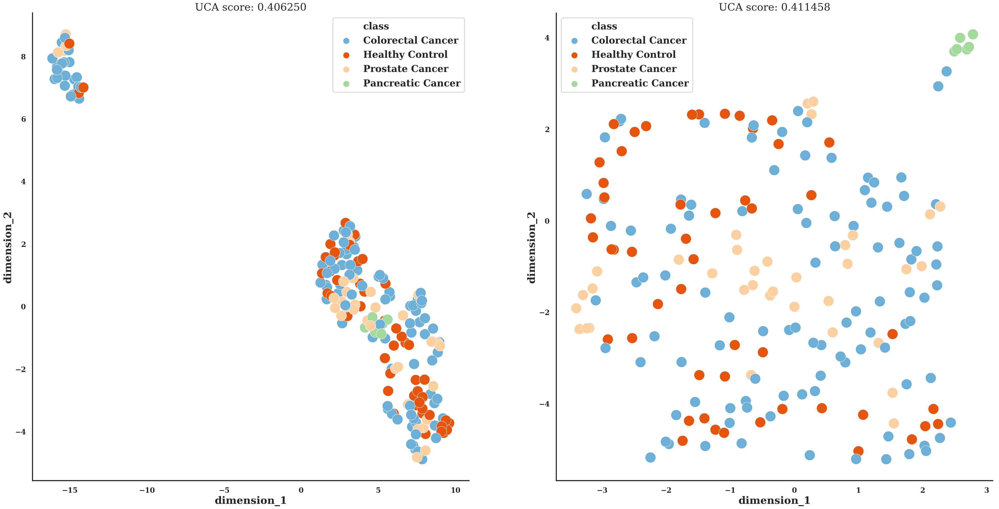

<Figure size 720x480 with 0 Axes>

<Figure size 720x480 with 0 Axes>

In [562]:
visualize_effect(original_mx,processed_mx,sample_class,method='UMAP')

In [313]:
best_methods = best_preprocess_methods['Normal-CRC']

In [338]:
impute_table = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+best_methods.split('.')[1]+'.'+exp_mx_name+'.txt')
normalize_table = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+best_methods.split('.')[1]+'.'+best_methods.split('.')[2]+'.'+exp_mx_name+'.txt',index_col=0)
batch_table = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+best_methods.split('.')[1]+'.'+best_methods.split('.')[2]+'.'+best_methods.split('.')[3]+'.'+exp_mx_name+'.txt',index_col=0)
processed_table = pd.read_table('output/'+dataset+'/matrix_processing/'+best_methods+'.txt',index_col=0)

In [565]:
def visualize_effect_all(original_mx,impute_mx, normalize_mx, batch_mx, sample_class,method='PCA'):
    fig, ax = plt.subplots(2,2,figsize=(30,30))
    PCA_plot_with_uca_score_sns(ax[0,0],original_mx,sample_class,method)
    PCA_plot_with_uca_score_sns(ax[0,1],impute_mx,sample_class,method)
    PCA_plot_with_uca_score_sns(ax[1,0],normalize_mx,sample_class,method)
    PCA_plot_with_uca_score_sns(ax[1,1],batch_mx,sample_class,method)
    

In [563]:
def visualize_effect_final(original_mx,final_mx, sample_class,method='PCA'):
    fig, ax = plt.subplots(1,2,figsize=(30,15))
    PCA_plot_with_uca_score_sns(ax[0],original_mx,sample_class,method)
    PCA_plot_with_uca_score_sns(ax[1],final_mx,sample_class,method)

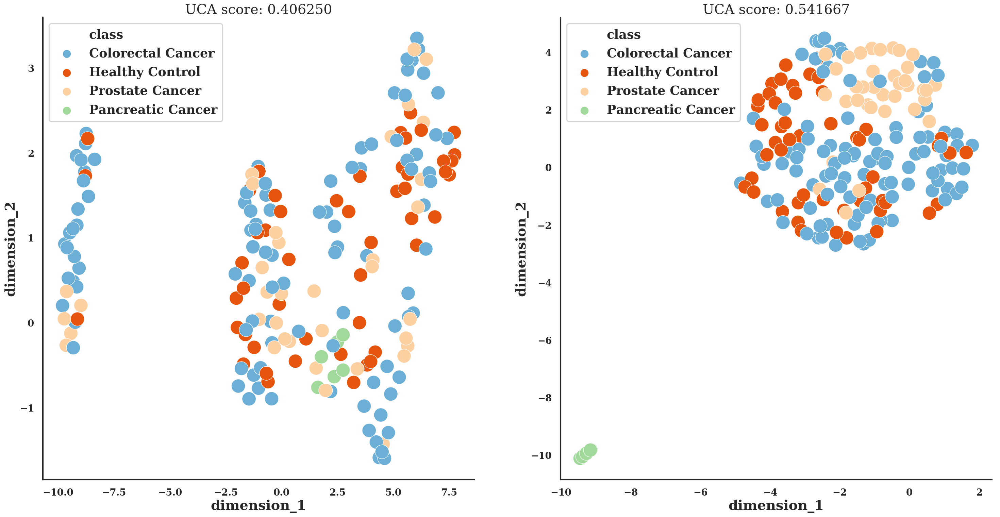

<Figure size 720x480 with 0 Axes>

<Figure size 720x480 with 0 Axes>

In [564]:
visualize_effect_final(original_mx,processed_table, sample_class,method='UMAP')

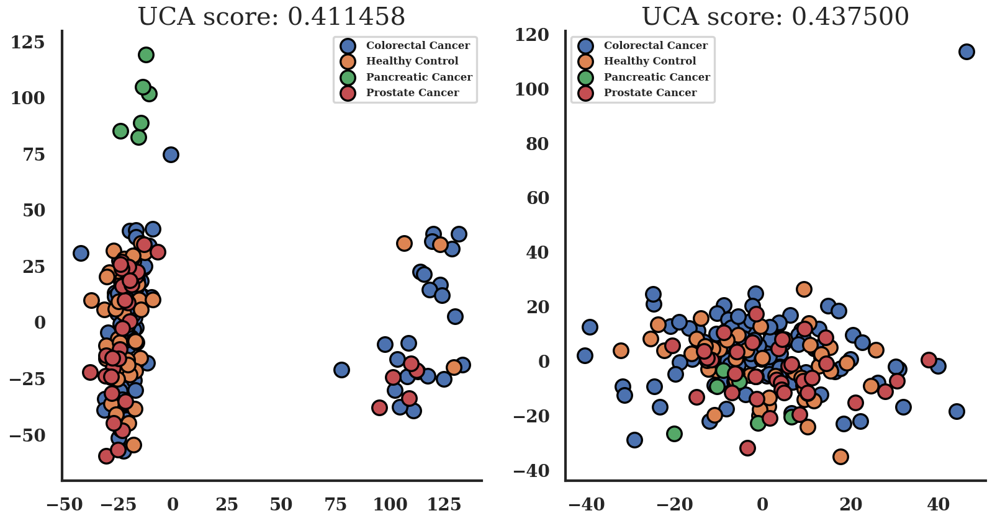

<Figure size 720x480 with 0 Axes>

<Figure size 720x480 with 0 Axes>

In [472]:
visualize_effect_final(original_mx,processed_table, sample_class,method='PCA')

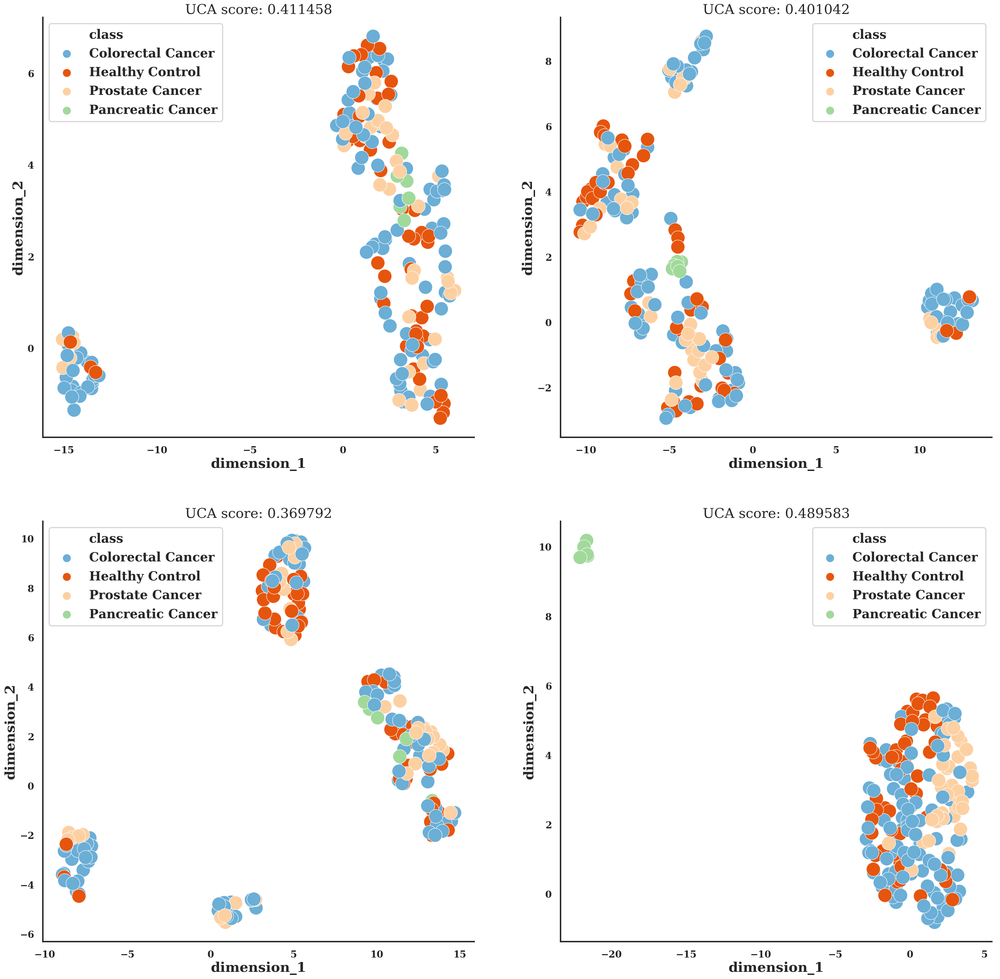

<Figure size 720x480 with 0 Axes>

<Figure size 720x480 with 0 Axes>

<Figure size 720x480 with 0 Axes>

<Figure size 720x480 with 0 Axes>

In [566]:
visualize_effect_all(original_mx, impute_table, normalize_table, batch_table, sample_class,method='UMAP')

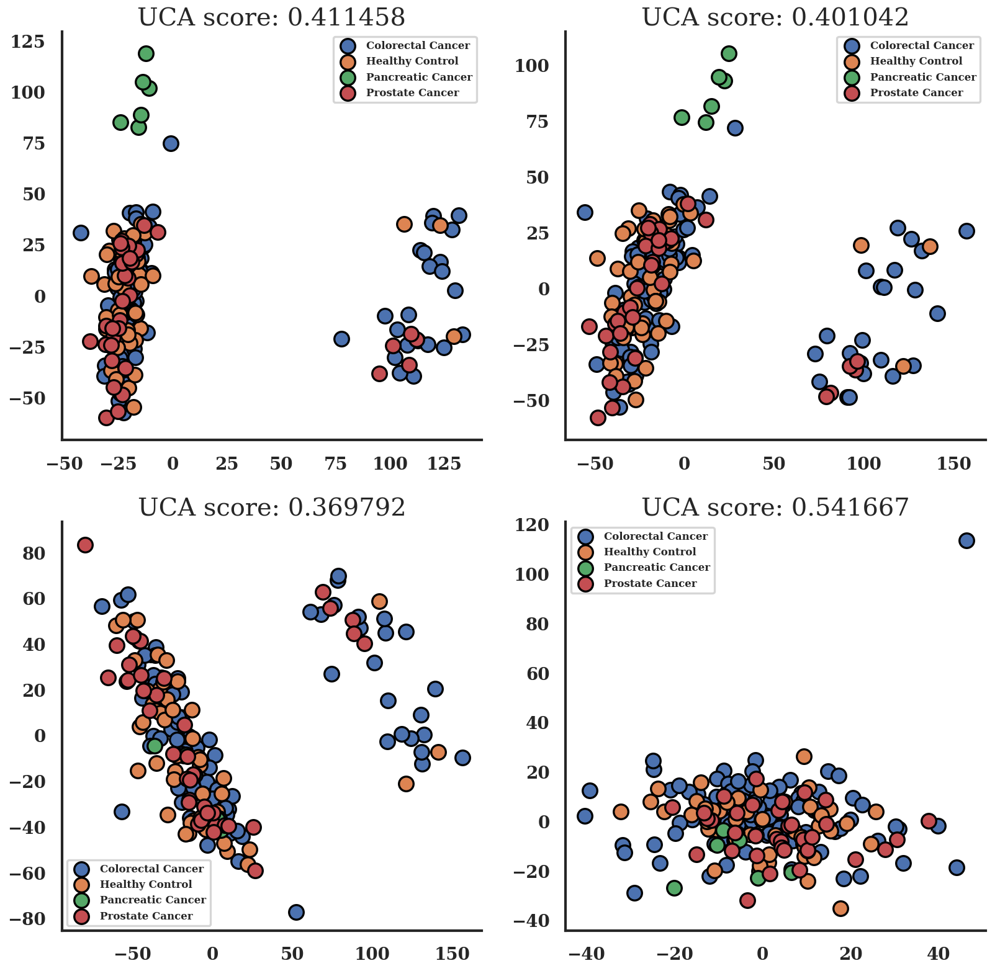

<Figure size 720x480 with 0 Axes>

<Figure size 720x480 with 0 Axes>

<Figure size 720x480 with 0 Axes>

<Figure size 720x480 with 0 Axes>

In [473]:
visualize_effect_all(original_mx, impute_table, normalize_table, batch_table, sample_class,method='PCA')

## top K feature
- cumulative
- top k feature

### cumulative

In [51]:
def topk_cumsum_plot(data, topk=20):
    total_sum = data.sum().sum()
    cumsumvalue = np.cumsum(- np.sort(- np.sum(original_mx,axis=1))/total_sum)
    fig, ax = plt.subplots(figsize=(16, 5))
    ax.bar(np.arange(0,topk),cumsumvalue[:topk],color='r',alpha=0.5)
    ax.set_xticks(np.arange(0,topk))
    ax.set_xticklabels(np.arange(1,1+topk))
    ax.set_title('cumulative bar plot of top '+str(topk)+' feature')

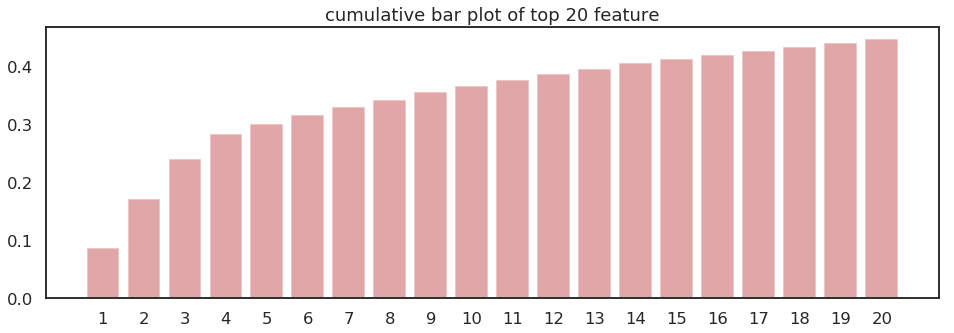

In [52]:
topk_cumsum_plot(processed_mx,topk=20)

### top k feature

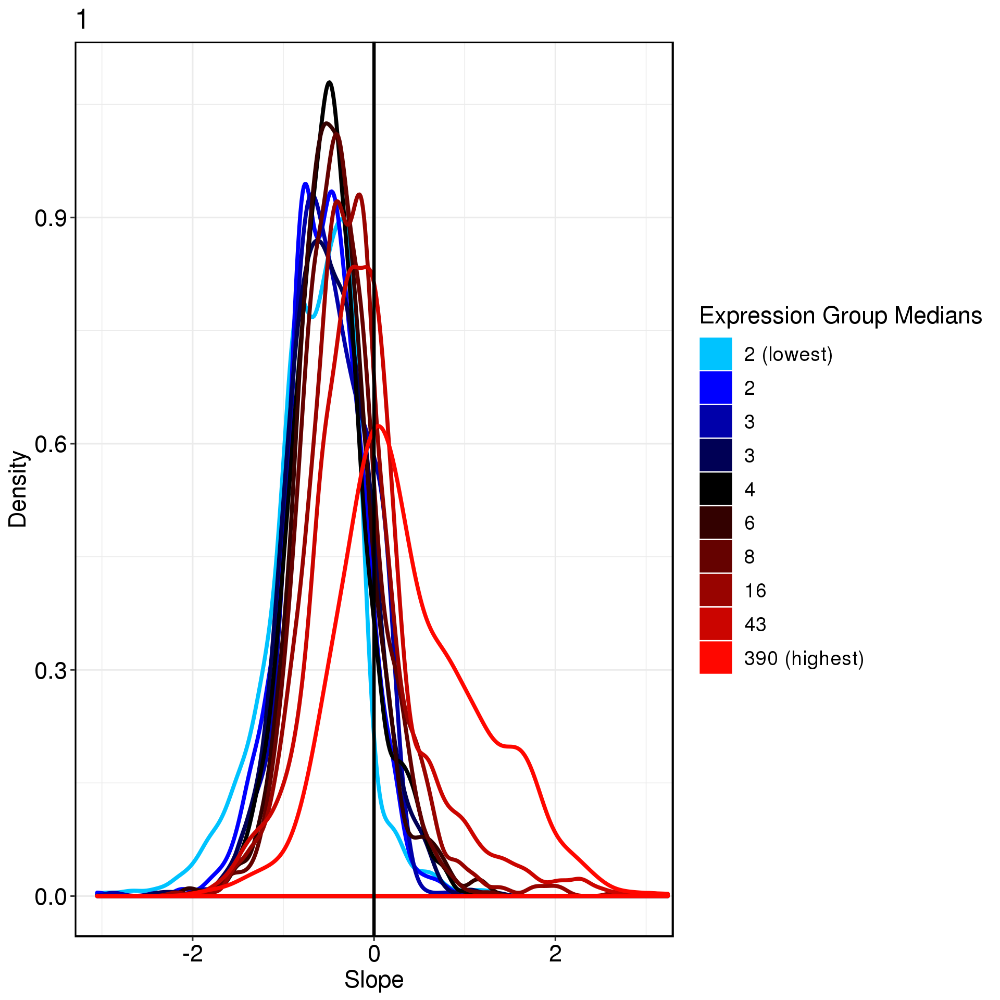

In [53]:
Image(filename='/home/xieyufeng/exSeek/png/plot_highest_exprs.png') 

## show batch
- counts
- by rna

In [465]:
def show_batch_total_counts(ax,batchtable,matrix, batchindex = 1):
    counts = matrix.sum()
    sumtable = pd.DataFrame(np.log(counts),columns=['log total counts'])
    sumtable_whole = pd.concat((sumtable,batchtable.loc[sumtable.index]),axis=1)
    #fig,ax=plt.subplots(figsize=(8,6))
    batchname = batchtable.columns[batchindex]
    sns.boxplot(data=sumtable_whole,x=batchname,y='log total counts',ax=ax)
    #ax.set_title('Batch effect: '+batchname)
    plt.figure(linewidth=30.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    plt.tight_layout()

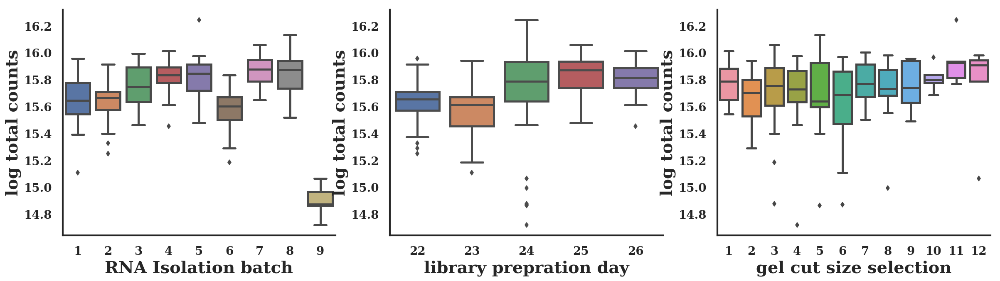

<Figure size 720x480 with 0 Axes>

<Figure size 720x480 with 0 Axes>

<Figure size 720x480 with 0 Axes>

In [467]:
fig, ax = plt.subplots(1,3,figsize=(24, 6))
for  i in range(3):
    show_batch_total_counts(ax[i],batchtable, original_mx, batchindex = i)
plt.tight_layout()

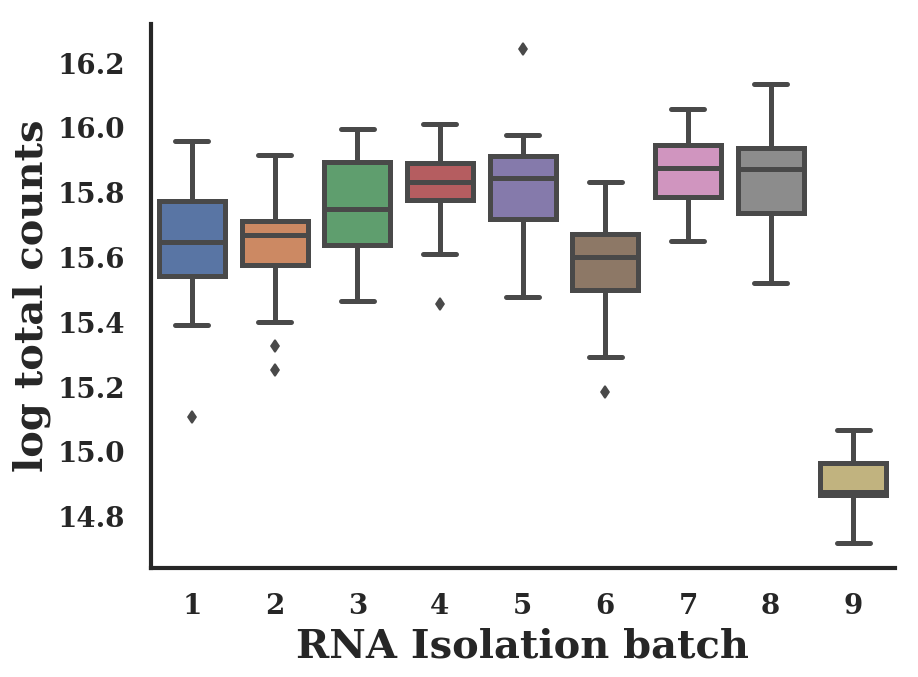

<Figure size 720x480 with 0 Axes>

In [466]:
fig, ax = plt.subplots(1,figsize=(8, 6))show_batch_total_counts(ax,batchtable, original_mx, batchindex = 0)

In [285]:
def show_batch_sns(data,sampleclass,batchinfo,batch_ind=0):
    X = np.log2(data + 0.001).T
    X = StandardScaler().fit_transform(X)
    method = 'UMAP'
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')

    X_pca = transform.fit_transform(X)
    plot_table = pd.DataFrame(X_pca[:,:2])
    plot_table.index = data.columns
    plot_table = pd.concat((plot_table,sampleclass.loc[plot_table.index]),axis=1)
    plot_table.columns = ['dimension_1','dimension_2','class']
    plot_table = pd.concat((plot_table,batchinfo.loc[plot_table.index]),axis=1)
    #display(plot_table)
    batchnum = np.unique(plot_table.iloc[:,3+batch_ind]).shape[0]
    
    fig, ax = plt.subplots(1,figsize=(20, 20))
    sns.scatterplot(ax=ax,data=plot_table,x="dimension_1", y="dimension_2",style="class",
                    palette=np.array(Category20c[20]).reshape(4,-1).T.ravel(),
                    #palette=np.array(Category20c[20])[np.arange(0,20,3)],
                    hue=plot_table.columns[3+batch_ind],s=300,alpha=0.7)
    plt.figure(linewidth=30.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)


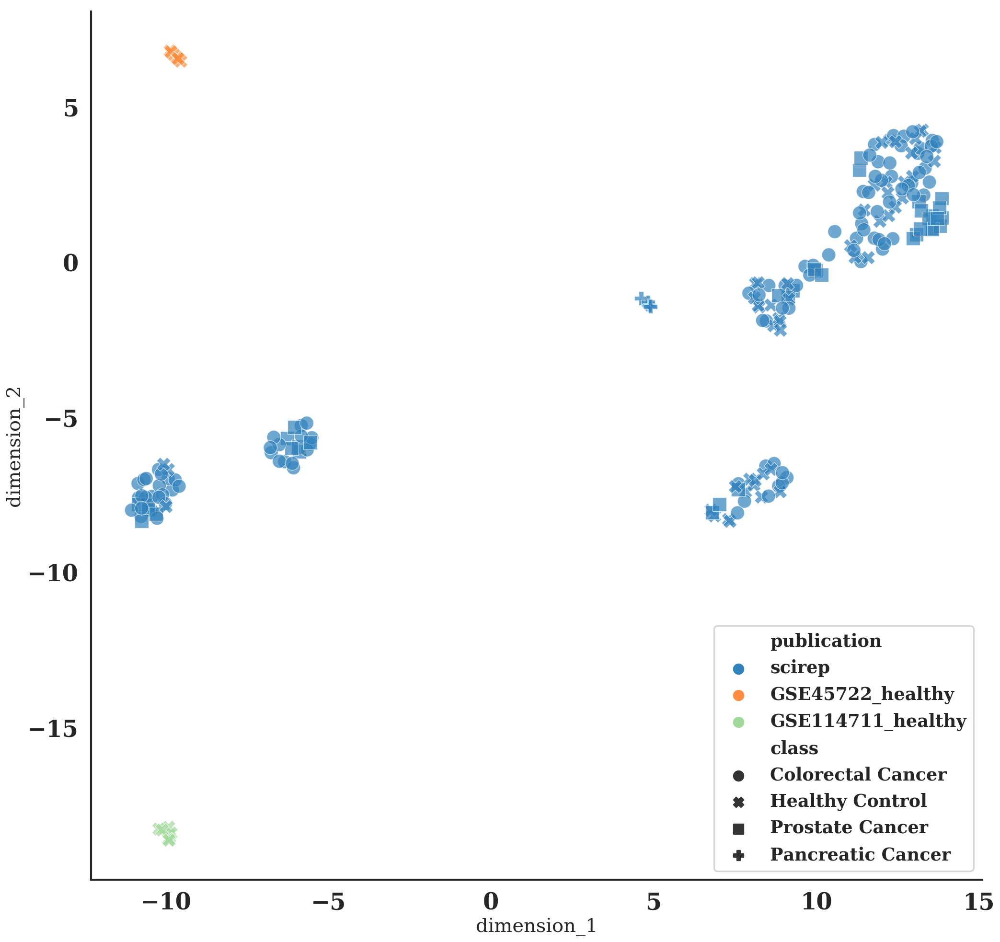

<Figure size 720x480 with 0 Axes>

In [286]:
show_batch_sns(exosome_small_mx,exosome_small_class,exosome_small_batch)

In [ ]:
show_batch_sns(original_mx,sample_class,batchtable)

In [250]:
exosome_small_mx = pd.read_table('output/exosome_small/count_matrix/domains_combined.txt',index_col=0)
exosome_small_batch = pd.read_table('data/exosome_small/batch_info.txt',index_col=0)
exosome_small_class = pd.read_table('data/exosome_small/sample_classes.txt',index_col=0)


In [ ]:
def PCA_plot_batch(ax,data,sampleclass,batchinfo,method = 'PCA'):
    X = np.log2(data + 0.001).T
    X = StandardScaler().fit_transform(X)
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')
    
    X_pca = transform.fit_transform(X)
    class_name = np.unique(sampleclass.label)
    
    for label, color in zip(class_name, 
                                tableau20[:class_name.shape[0]]):
        indices = np.nonzero(sampleclass.loc[data.columns].label == label)[0]
        ax.scatter(X_pca[indices, 0], X_pca[indices, 1], s=200,alpha=1 ,edgecolors = 'black',label=label)
    ax.legend(fontsize=10)
    plt.figure(linewidth=30.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    uca_score = get_clustering_score(data, sampleclass)
    ax.set_title('UCA score: {:.6f}'.format(uca_score))
    #print('Alignment score: {}'.format(knn_score(X_pca, sampleclass.loc[data.columns.values].values.ravel() )))
    return uca_score

In [57]:
def plot_rna_batch(ax,rnaname,typetable,batchtable,batchindex=1):
    '''
    typetable: table_ratio
    rnaname certain type pf rna
    '''
    counts = typetable.T.loc[rnaname].T
    sumtable = pd.DataFrame(counts)
    sumtable_whole = pd.concat((sumtable.loc[batchtable.index],batchtable),axis=1)
    batchname = batchtable.columns[batchindex]
    sns.boxplot(data=sumtable_whole,x=batchname,y=rnaname,ax=ax)
    ax.set_title('batch effect: '+batchname+ ' by '+rnaname,size=16)
    plt.tight_layout()

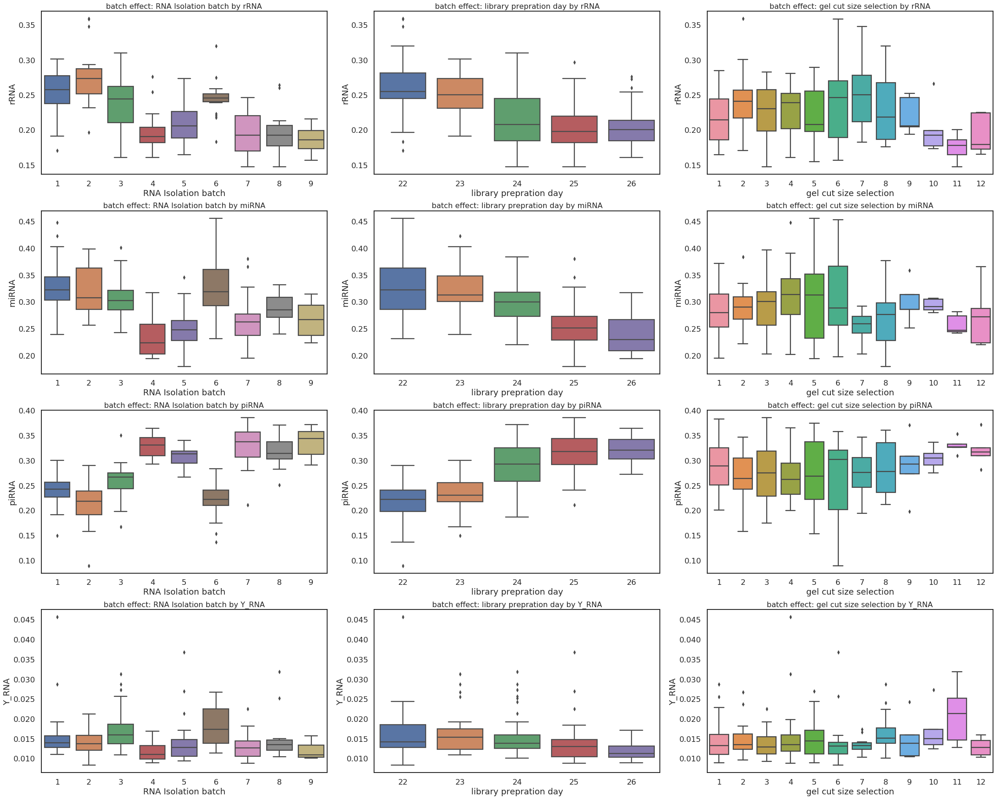

In [71]:
fig, ax = plt.subplots(4,3,figsize=(30, 24))
for i in range(4):
    for j in range(3):
        plot_rna_batch(ax[i,j],rnanames[i],table_ratio,batchtable,batchindex=j)

# Evaluation

In [15]:
import datetime
now = datetime.datetime.now()
timenow = '{}.{}.{}.{}:{}'.format(now.year,now.month,now.day,now.hour,now.minute)
savepath = 'output/candidate/'+dataset+'/'+timenow+'/'
if not os.path.exists(savepath):
    os.mkdir(savepath)

## feature recurrence

HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

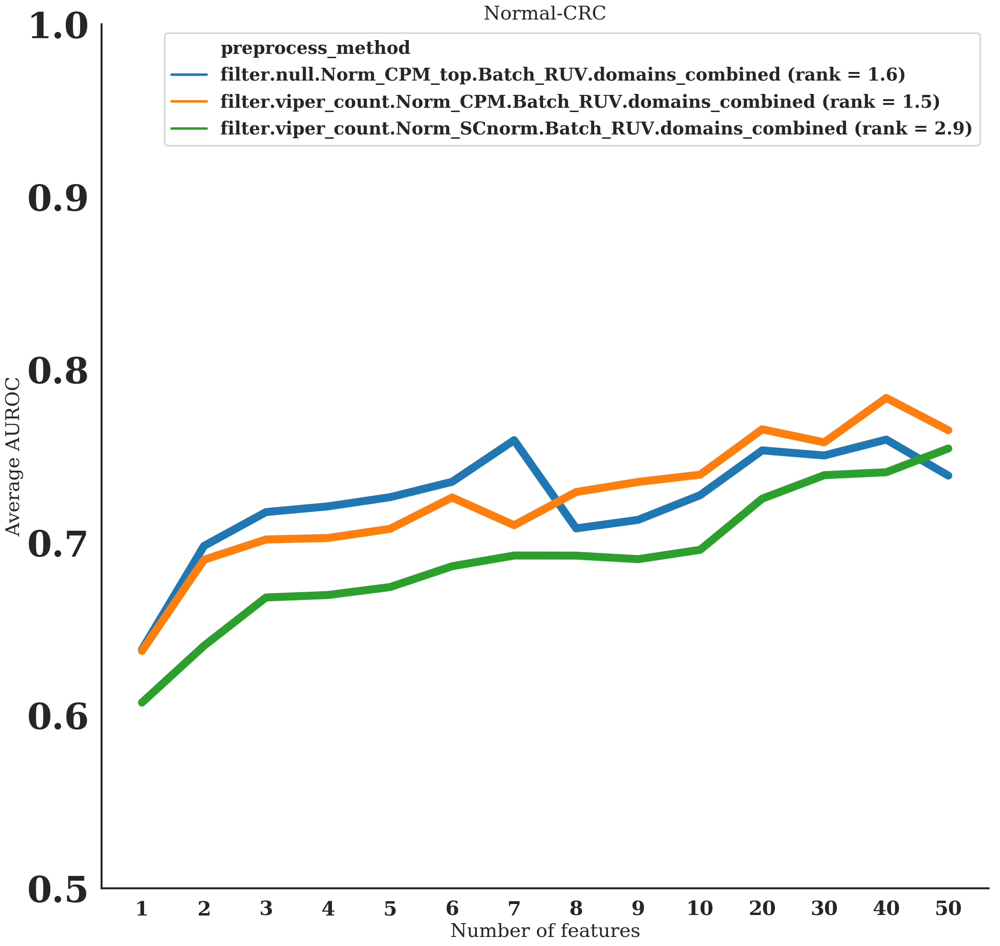

<Figure size 720x480 with 0 Axes>

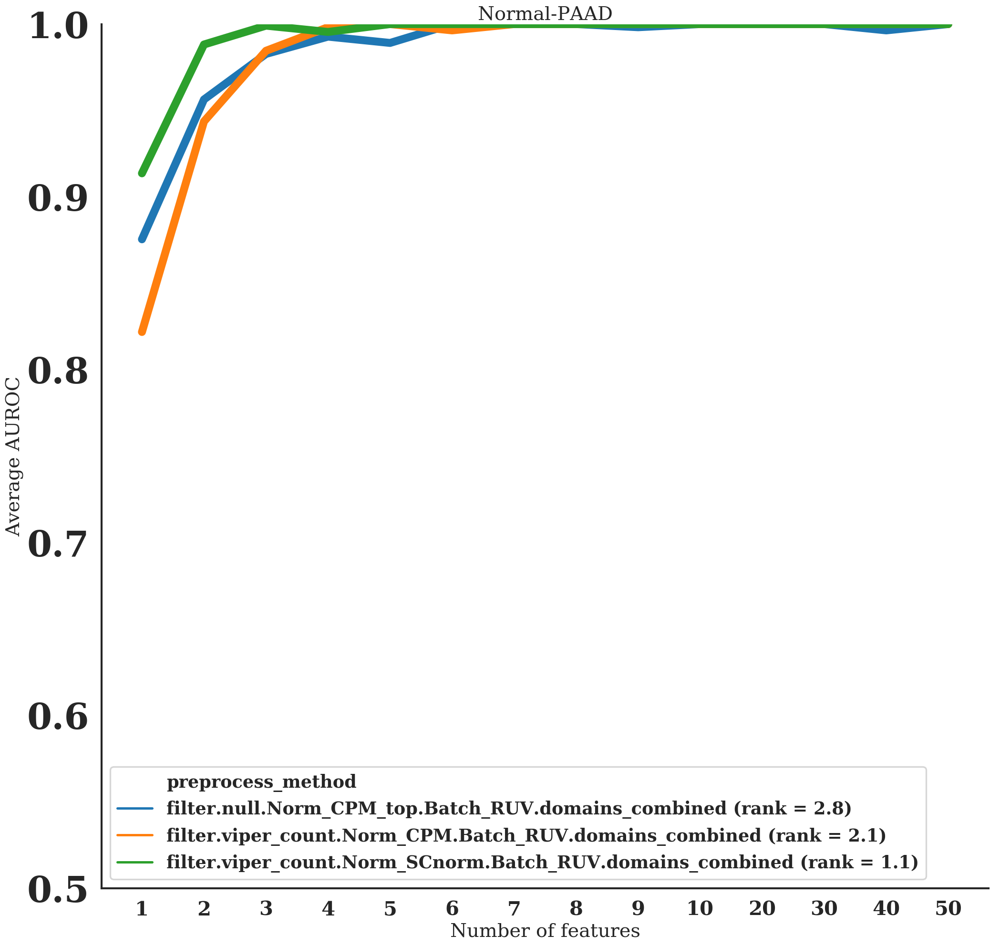

<Figure size 720x480 with 0 Axes>

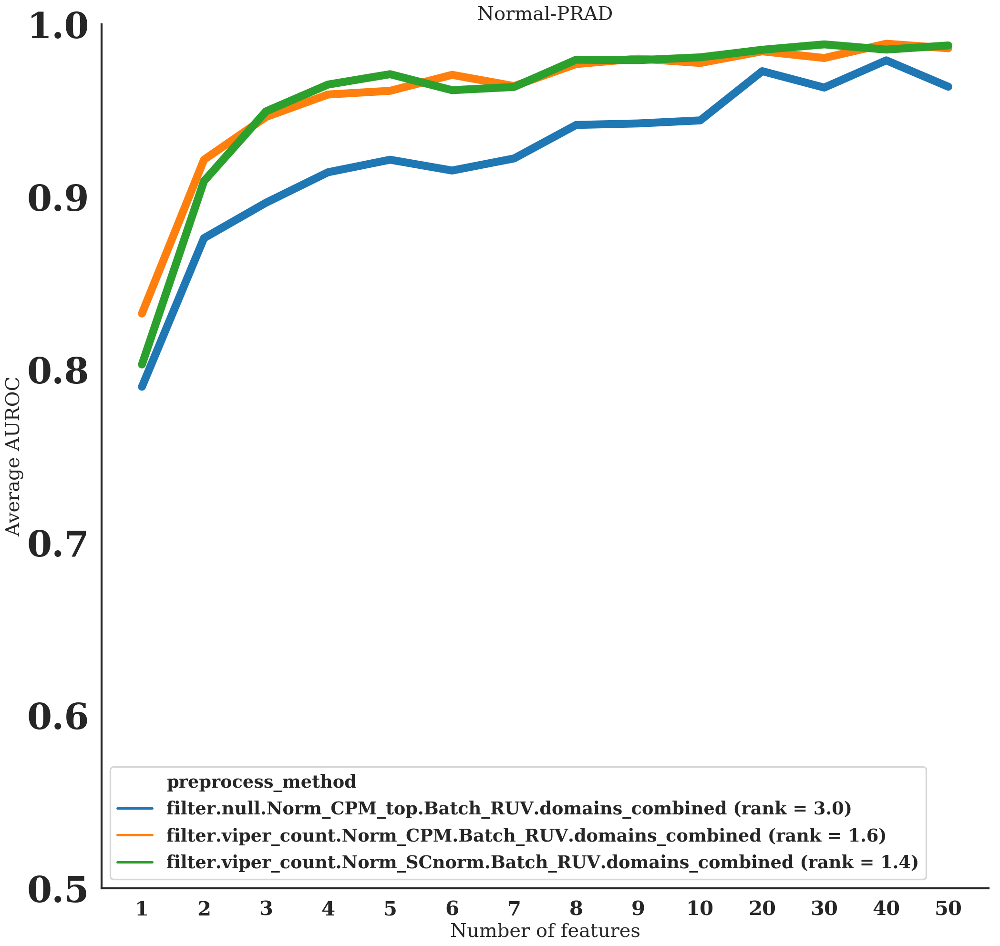

<Figure size 720x480 with 0 Axes>

In [502]:
#use uca to presort methods
preselected_methods = np.loadtxt('output/'+dataset+'/select_preprocess_method/uca_score/'+exp_mx_name+'/selected_methods.txt',dtype='str')
preselected_methods_dir = np.array([preselected_methods[i]+'.'+exp_mx_name for i in range(preselected_methods.shape[0])])

def compare_preprocess_methods(output_dir, preselected_methods_dir, savepath=savepath,title=None,savefig=True):
    records = []
    pbar = tqdm(unit='directory')
    for preprocess_method in preselected_methods_dir:#os.listdir(output_dir):#
        for compare_group in os.listdir(os.path.join(output_dir, preprocess_method)):
            for feature_selection_method in os.listdir(os.path.join(output_dir, preprocess_method, compare_group)):
                classifier, n_select, select_method  = feature_selection_method.split('.')
                record = {
                    'compare_group': compare_group,
                    'classifier': classifier,
                    'n_features': n_select,
                    'preprocess_method': preprocess_method
                }
                try:
                    metrics = pd.read_table(os.path.join(output_dir,
                        preprocess_method, compare_group, feature_selection_method,
                        'metrics.txt'))
                except:
                    continue
                record['test_roc_auc_mean'] = metrics['test_roc_auc'].mean()
                pbar.update(1)
                records.append(record)
    pbar.close()
    records = pd.DataFrame.from_records(records)
    records['n_features'] = records.loc[:, 'n_features'].astype(np.int32)
    
    best_preprocess_methods = {}
    for compare_group, sub_df in records.groupby('compare_group'):
        pivot = sub_df.pivot_table(
            index='preprocess_method', columns='n_features', values='test_roc_auc_mean')
        #print(pivot.iloc[:, 0])
        #print(np.argsort(np.argsort(pivot.values, axis=0), axis=0)[:, 0])
        mean_ranks = np.mean(pivot.shape[0] - np.argsort(np.argsort(pivot.values, axis=0), axis=0), axis=1)
        mean_ranks = pd.Series(mean_ranks, index=pivot.index.values)
        mean_ranks = mean_ranks.sort_values()
        rename_index = ['{} (rank = {:.1f})'.format(name, value) for name, value in zip(mean_ranks.index, mean_ranks.values)]
        rename_index = pd.Series(rename_index, index=mean_ranks.index.values)
        sub_df = sub_df.copy()
        sub_df['preprocess_method'] = rename_index[sub_df['preprocess_method'].values].values
        sub_df['n_features'] = sub_df['n_features'].astype('int')
        sub_df = sub_df.sort_values(['preprocess_method', 'n_features'], ascending=True)
        sub_df['n_features'] = sub_df['n_features'].astype('str')
        fig, ax = plt.subplots(figsize=(20, 20))
        '''
        for preprocess_method in rename_index.values:
            tmp_df = sub_df[sub_df['preprocess_method'] == preprocess_method]
            ax.plot(np.arange(tmp_df.shape[0]) + 1, tmp_df['test_roc_auc_mean'], label=preprocess_method,linewidth=5)

            ax.set_xticks(np.arange(tmp_df.shape[0]) + 1)
            ax.set_xticklabels(tmp_df['n_features'])
        '''
        #display(sub_df.iloc[np.isin(sub_df['preprocess_method'],rename_index.values)])
        tmpdf = sub_df.iloc[np.isin(sub_df['preprocess_method'],rename_index.values)]
        #tmpdf.n_features = pd.to_numeric(tmpdf.n_features)
        #tmpdf = tmpdf.sort_values(by=['n_features'], ascending=True)
        #tmpdf.n_features = tmpdf.n_features.astype('str')
        sns.lineplot(ax=ax,data=tmpdf,sort=False,
                     x='n_features',y = 'test_roc_auc_mean',hue='preprocess_method',linewidth=10,
                     )
        ax.set_xlabel('Number of features')
        ax.set_ylabel('Average AUROC')
        #ax.legend(title='Preprocess method', bbox_to_anchor=(1.04,0.5), 
           #         loc="center left", borderaxespad=0,fontsize=10)
        ax.set_ylim(0.5, 1)
        ax.set_title(compare_group)
        plt.figure(linewidth=30.5)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        best_preprocess_methods[compare_group] = sub_df.iloc[0]['preprocess_method']
        if savefig:
            fig.savefig(savepath+'AUC_matrix_processing'+compare_group+'.png', bbox_inches='tight')
        #print (best_preprocess_methods)
        best_preprocess_methods[compare_group] = mean_ranks.index[0]
    return best_preprocess_methods

best_preprocess_methods = compare_preprocess_methods('output/'+dataset+'/feature_selection',preselected_methods_dir)

In [503]:
best_preprocess_methods

{'Normal-CRC': 'filter.viper_count.Norm_CPM.Batch_RUV.domains_combined',
 'Normal-PAAD': 'filter.viper_count.Norm_SCnorm.Batch_RUV.domains_combined',
 'Normal-PRAD': 'filter.viper_count.Norm_SCnorm.Batch_RUV.domains_combined'}

## Compare Features: AUC line plot

In [504]:
cpm_table_origin_ = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+exp_mx_name+'.txt')
cpm_table_origin =  cpm_table_origin_/cpm_table_origin_.sum(axis=0)*10e6
length_tmp = np.array([cpm_table_origin.index[i].split('|')[-1] for i in range(cpm_table_origin.index.shape[0])]).astype('int')-\
np.array([cpm_table_origin.index[i].split('|')[-2] for i in range(cpm_table_origin.index.shape[0])]).astype('int')
rpkm_table_origin = (cpm_table_origin_.T/length_tmp*1000).T


def calculate_fc(table,original_index,sample_class, class_compare,cpm_table_origin):
    samples_use = np.array(sample_class.index)[np.isin(sample_class.label,class_compare)]
    sample_class_use = sample_class.iloc[np.isin(sample_class.label,class_compare)]
    sample_class_1_use = sample_class_use.iloc[np.where(sample_class_use.label ==class_compare[0])]
    sample_class_2_use = sample_class_use.iloc[np.where(sample_class_use.label ==class_compare[1])]
    table_selected = table.loc[original_index]
    length = np.array([original_index[i].split('|')[-1] for i in range(original_index.shape[0])]).astype('int')-\
np.array([original_index[i].split('|')[-2] for i in range(original_index.shape[0])]).astype('int')
    #print (length)
    rpkmtable = (table_selected.T/length).T*1000
    #display(rpkmtable)
    #display(table_selected)
    rpkmtable_ = pd.concat((rpkmtable.loc[original_index,sample_class_1_use.index],
               rpkmtable.loc[original_index,sample_class_2_use.index]),axis=1)
    cpmtable_ = pd.concat((cpm_table_origin.loc[original_index,sample_class_1_use.index],
               cpm_table_origin.loc[original_index,sample_class_2_use.index]),axis=1)
    return np.mean(np.log2(rpkmtable.loc[:,sample_class_1_use.index]+0.001),axis=1) -\
np.mean(np.log2(rpkmtable.loc[:,sample_class_2_use.index]+0.001),axis=1),rpkmtable_,cpmtable_
def compare_features(path,sample_class,class_compare,compare_group,savepath=savepath,save_table=True):
    pbar = tqdm(unit='directory')
    feature_lists = {}
    for feature_selection_method in os.listdir(path):
        classifier, n_features, select_method  = feature_selection_method.split('.')
        n_features = int(n_features)
        if n_features > 10:
            continue
        # feature importance
        feature_lists[n_features] = pd.read_table(os.path.join(path,
            feature_selection_method, 'feature_importances.txt'), header=None, index_col=0).iloc[:, 0]
        feature_lists[n_features].index = feature_lists[n_features].index.astype('str')
        pbar.update(1)
    # feature union set
    feature_set = reduce(np.union1d, [a.index.values for a in feature_lists.values()])
    # build feature importance matrix
    feature_matrix = pd.DataFrame(np.zeros((len(feature_set), len(feature_lists))),
                                  index=feature_set, columns=list(feature_lists.keys()))
    for n_features, feature_importance in feature_lists.items():
        feature_matrix.loc[feature_importance.index.values, n_features] = feature_importance.values
    feature_matrix.columns = feature_matrix.columns.astype('int')
    feature_matrix.index = feature_matrix.index.astype('str')
    
    feature_matrix = feature_matrix.loc[:, feature_matrix.columns.sort_values().values]
    original_index = feature_matrix.index
    feature_info = feature_matrix.index.to_series().str.split('|', expand=True)
    feature_info.columns = ['gene_id', 'gene_type', 'gene_name', 'feature_id', 'transcript_id', 'start', 'end']

    feature_matrix.index = feature_info.loc[:, 'gene_name'].values \
        + '|' + feature_info.loc[:, 'gene_type'].values \
        + '|' + feature_info.loc[:, 'gene_id'].values \
    
    # build feature indicator matrix
    feature_indicator_matrix = pd.DataFrame(np.zeros((len(feature_set), len(feature_lists))),
                                  index=feature_set, columns=list(feature_lists.keys()))
    for n_features, feature_importance in feature_lists.items():
        feature_indicator_matrix.loc[feature_importance.index.values, n_features] = 1
    feature_indicator_matrix.columns = feature_indicator_matrix.columns.astype('int')
    feature_indicator_matrix = feature_indicator_matrix.loc[:, feature_indicator_matrix.columns.sort_values().values]
    
    feature_indicator_matrix.index = feature_info.loc[:, 'gene_name'].values \
        + '|' + feature_info.loc[:, 'gene_type'].values \
        + '|' + feature_info.loc[:, 'gene_id'].values
    #fig, ax = plt.subplots(figsize=(6, 8))
    #sns.heatmap(feature_indicator_matrix,
    #            cmap=sns.light_palette('green', as_cmap=True), cbar=False, ax=ax, linewidth=1)
    #ax.set_xlabel('Number of features')
    #ax.set_ylabel('Features')
    foldchange,rpkmtable,cpmtable = calculate_fc(processed_matrix, original_index,sample_class,class_compare,cpm_table_origin)
    foldchange.index = feature_matrix.index
    feature_matrix = pd.concat((feature_matrix,foldchange),axis=1)
    feature_matrix.columns = np.concatenate((np.arange(1,11).astype('str'),np.array(['fold change'])))
    #display (feature_matrix)
    feature_matrix.index = feature_info.loc[:, 'gene_name'].values \
        + '|' + feature_info.loc[:, 'gene_type'].values \
    + '|' + feature_info.loc[:, 'feature_id'].values \
        + '|' + feature_info.loc[:, 'transcript_id'].values
    #display (feature_matrix)
    display(feature_matrix.style\
        .background_gradient(cmap=sns.light_palette('green', as_cmap=True))\
        .set_precision(2)\
        .set_caption(path))
    pbar.close()
    if save_table:
        feature_matrix.to_csv(savepath+compare_group+'_feature_table.txt',sep='\t')
    return feature_matrix,feature_indicator_matrix,original_index,foldchange,rpkmtable,cpmtable


In [505]:
def scale(axis,table):
    '''
    axis: 0(by sample)/1(by feature)/2(both 0 and 1)
    '''
    scaler = StandardScaler()
    arr = np.array(table)
    if axis==0:
        return scaler.fit_transform(arr)
    elif axis==1:
        return scaler.fit_transform(arr.T).T
    elif axis==2:
        return scaler.fit_transform(scaler.fit_transform(arr).T).T
def clustermap(processed_matrix,featurename,sample_class, class_compare,compare_group,savepath=savepath,savefig=True):
    samples_use = np.array(sample_class.index)[np.isin(sample_class.label,class_compare)]
    sample_class_use = sample_class.iloc[np.isin(sample_class.label,class_compare)]
    cpm_table = processed_matrix
    cpm_table_use = cpm_table.loc[featurename,samples_use]
    #display(cpm_table_use)
    cpm_matrix= np.log2(np.array(cpm_table_use)+0.001)
    cpm_table_use.iloc[:,:] = RobustScaler().fit_transform(cpm_matrix.T).T
    rgblabel = np.repeat('r',samples_use.shape[0])
    rgblabel[np.where(sample_class_use.label==class_compare[-1])] = 'b'
    cpm_table_use.index = np.array([cpm_table_use.index[i].split('|')[2]+'|'+cpm_table_use.index[i].split('|')[1] for i in range(cpm_table_use.index.shape[0]) ])
    sns_plot = sns.clustermap(cpm_table_use,cmap='vlag',figsize=(70,20),col_colors=rgblabel)
    if savefig:
        sns_plot.savefig(savepath+compare_group+'_clustermap.png', bbox_inches='tight')
    plt.rc('xtick', labelsize='large')
    plt.rc('ytick', labelsize='large')
    return cpm_table_use,sample_class_use

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

,1,2,3,4,5,6,7,8,9,10,fold change
30984|tRNA|peak_320|30984,0,0,0.33,0.29,0,0,0,0.14,0.13,0,0.32
Y_RNA|Y_RNA|peak_537|ENST00000362602.1,0,0.46,0,0,0,0,0,0,0,0,0.33
AC112719.2|lncRNA|peak_1115|ENST00000501239.2,0,0,0,0,0,0,0,0,0,0.11,0.17
U1|snRNA|peak_1443|ENST00000605806.1,0,0,0,0,0,0,0.16,0,0,0,-0.094
chr1_245029980_245030040_+|genomic|peak_2143|chr1,0,0,0,0,0,0,0,0,0.059,0,-0.15
hsa-miR-125a-5p|miRNA|hsa-miR-125a-5p|hsa-miR-125a-5p,0,0,0.32,0.26,0.2,0.16,0,0.14,0.099,0.14,-0.31
hsa-miR-128-3p|miRNA|hsa-miR-128-3p|hsa-miR-128-3p,0,0.54,0,0,0,0.18,0.17,0,0.12,0,-0.25
hsa-miR-1343-3p|miRNA|hsa-miR-1343-3p|hsa-miR-1343-3p,0,0,0,0,0,0.19,0.18,0.1,0.12,0.16,-0.37
hsa-miR-139-5p|miRNA|hsa-miR-139-5p|hsa-miR-139-5p,0,0,0,0.25,0.36,0.21,0,0,0.14,0,-0.18
hsa-miR-151a-3p|miRNA|hsa-miR-151a-3p|hsa-miR-151a-3p,0,0,0,0,0,0,0,0,0,0.081,-0.12


HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

,1,2,3,4,5,6,7,8,9,10,fold change
13011|tRNA|peak_19|13011,0,0,0,0,0,0,0,0,0,0.24,-0.041
20274|tRNA|peak_59|20274,0,0,0,0,0,0,0,0,0.08,0,-0.039
20277|tRNA|peak_62|20277,0,0,0,0,0.35,0,0,0,0,0,0.11
20653|tRNA|peak_79|20653,0,0,0,0,0,0,0,0,0.12,0,0.078
20820|tRNA|peak_85|20820,0,0,0.4,0,0,0,0,0,0,0,0.023
22267|tRNA|peak_133|22267,0,0,0,0,0,0,0,0,0,0,0.021
22350|tRNA|peak_135|22350,0,0,0,0,0.12,0,0,0,0,0,-0.11
22351|tRNA|peak_136|22351,0,0,0,0,0,0,0,0.16,0,0,-0.1
22778|tRNA|peak_142|22778,0,0,0,0,0,0,0,0,0.16,0,-0.14
24304|tRNA|peak_154|24304,0,0,0,0,0,0,0.28,0,0,0,-0.1


HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

,1,2,3,4,5,6,7,8,9,10,fold change
28530|tRNA|peak_249|28530,0,0,0,0,0,0.1,0,0,0,0,0.1
30971|tRNA|peak_310|30971,0,0,0.24,0,0,0,0,0,0,0,-0.95
Y_RNA|Y_RNA|peak_538|ENST00000362606.1,0,0,0,0,0,0,0,0,0,0.018,-0.11
Y_RNA|Y_RNA|peak_558|ENST00000363014.1,0,0,0,0,0,0,0.078,0.06,0,0,0.2
Y_RNA|Y_RNA|peak_576|ENST00000363391.1,0,0,0,0.12,0,0,0,0,0,0.021,-0.21
Y_RNA|Y_RNA|peak_591|ENST00000363781.1,0,0,0,0,0,0.11,0,0,0,0,-0.43
Y_RNA|Y_RNA|peak_604|ENST00000364128.1,0,0,0,0,0,0,0.089,0.13,0.058,0.08,-0.15
RNU1-34P|snRNA|peak_615|ENST00000364421.1,0,0,0,0,0,0,0.07,0,0,0,-0.4
Y_RNA|Y_RNA|peak_725|ENST00000384198.1,0,0,0,0,0,0,0,0.098,0,0,-0.73
Y_RNA|Y_RNA|peak_746|ENST00000384511.1,0,0,0,0.16,0,0,0,0,0.065,0,0.43


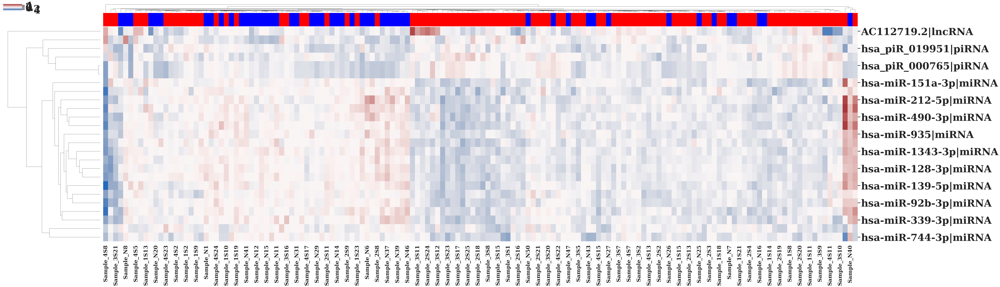

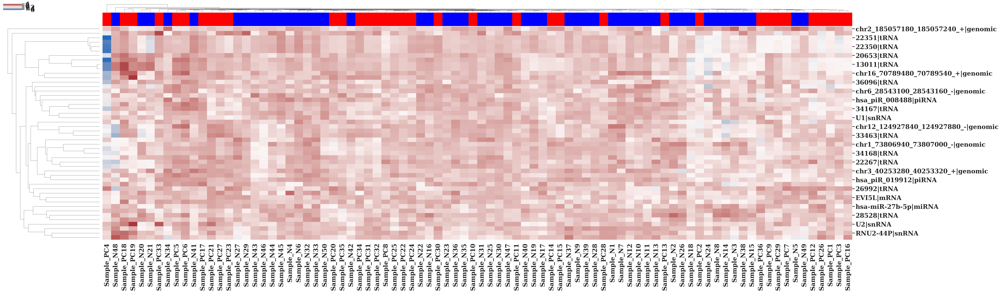

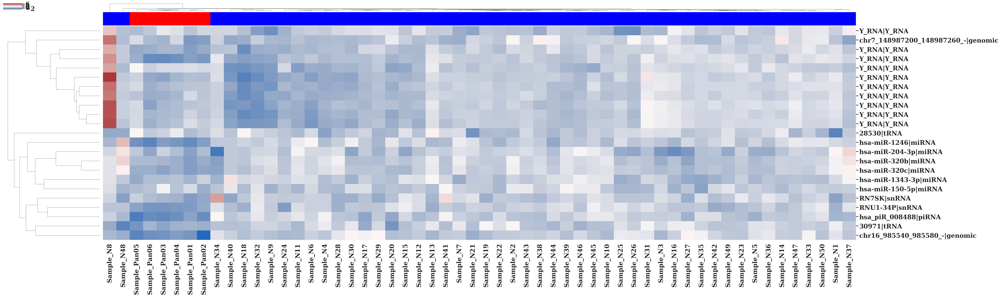

In [506]:
output_feature_selection_path = 'output/'+dataset+'/feature_selection/'
feature_matrix,feature_indicator_matrix,original_index,foldchange,rpkmtable,cpm_table_use,sample_class_use,cpmtable = {},{},{},{},{},{},{},{}
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    class_info = 'data/'+dataset+'/sample_classes.txt'
    if dataset =='scirep':
        if compare_group=='Normal-CRC':
            class_compare = np.array(['Colorectal Cancer', 'Healthy Control']) 
        elif compare_group=='Normal-PAAD':
            class_compare = np.array(['Prostate Cancer', 'Healthy Control']) 
        elif compare_group=='Normal-PRAD':
            class_compare = np.array(['Pancreatic Cancer', 'Healthy Control']) 
    elif dataset =='lulab_hcc':
        if compare_group=='Normal-HCC':
            class_info = 'data_old/labels/sample_classes_hcc.txt'
        if compare_group=='Normal-HCC':
            class_compare = np.array(['HCC', 'Normal']) 
        elif compare_group=='Normal-stage_A':
            class_compare = np.array(['stage_A', 'Normal']) 
    elif dataset =='exorbase':
        if compare_group=='Normal-HCC':
            class_compare = np.array(['HCC', 'Healthy']) 
        elif compare_group=='Normal-CRC':
            class_compare = np.array(['CRC', 'Healthy']) 
        elif compare_group=='Normal-PAAD':
            class_compare = np.array(['PAAD', 'Healthy']) 
    sample_class = pd.read_table(class_info,sep='\t',index_col=0)
    processed_matrix = pd.read_table('output/'+dataset+'/matrix_processing/'+preprocess_method+'.txt',sep='\t',index_col=0)
    feature_matrix[compare_group],feature_indicator_matrix[compare_group],\
    original_index[compare_group],foldchange[compare_group],rpkmtable[compare_group],cpmtable[compare_group] = compare_features(output_feature_selection_path+'{}/{}'.format(preprocess_method,compare_group),sample_class,class_compare,compare_group)
    features =  feature_matrix[compare_group].index
    cpm_table_use[compare_group],sample_class_use[compare_group] =  clustermap(processed_matrix,original_index[compare_group],sample_class,class_compare,compare_group)
    

## bar plot of feature importance

In [554]:
def feature_weight_bar(feature_weight_table,detable,nums_retain=10,rpkmtable=rpkmtable,original_index=original_index, savepath=savepath,savefig=True,compare_group=compare_group):
    
    selected_table = feature_weight_table.iloc[:,nums_retain-1:]
    selected_feature = original_index[np.where(selected_table.iloc[:,0]!=0)]
    nums_retain = min(selected_feature.shape[0],nums_retain)
    selected_table = selected_table.iloc[np.where(selected_table.iloc[:,0]!=0)]
    featurename = np.array(selected_table.index)#np.array([selected_table.index[i].split('|')[0] for  i in range(selected_table.shape[0])])
    #feature_weight = np.array(feature_weight_table.sum(axis=1))
    feature_weight = np.array(selected_table.iloc[:,0])
    fc = np.array(selected_table.iloc[:,1])
    fc = fc[np.argsort(-feature_weight)]
    rpkm = np.array(rpkmtable.mean())
    rpkm = rpkm[np.argsort(-feature_weight)]
    featurename = featurename[np.argsort(-feature_weight)]
    selected_feature = selected_feature[np.argsort(-feature_weight)]
    feature_weight = -np.sort(-feature_weight)
    featurename = np.array([featurename[i].split('|')[2]+'|'+featurename[i].split('|')[1] for i in range(len(featurename))])
    dataframe= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),feature_weight.reshape(-1,1)),axis=1),columns=['name','weight'])
    dataframe.weight  =  pd.to_numeric(dataframe.weight)
    dataframe_= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),fc.reshape(-1,1)),axis=1),columns=['name','fc'])
    dataframe_.fc  =  pd.to_numeric(dataframe_.fc)
    dataframe_rpkm= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','rpkm'])
    dataframe_rpkm.rpkm  =  pd.to_numeric(dataframe_rpkm.rpkm)
    fig,ax=plt.subplots(1,3,figsize=(nums_retain*4,12))
    sns.barplot(ax=ax[0],data=dataframe_.iloc[:nums_retain],y='name',x='fc',color='r',saturation=1)
    ax[0].set_xlabel('fold change')
    sns.barplot(ax=ax[1],data=dataframe.iloc[:nums_retain],y='name',x='weight',color='b',saturation=1)
    sns.barplot(ax=ax[2],data=dataframe_rpkm.iloc[:nums_retain],y='name',x='rpkm',color='g',saturation=1)
    ax[2].set_xlabel('cpm')
    plt.figure(linewidth=30.5)
    for i in range(3):
        ax[i].spines['right'].set_visible(False)
        ax[i].spines['top'].set_visible(False)
    fig.tight_layout()
    if savefig:
        fig.savefig(savepath+compare_group+'_bar_plot.png', bbox_inches='tight')
    ax[1].get_yaxis().set_ticks([])
    ax[1].set_ylabel('')
    ax[2].get_yaxis().set_ticks([])
    ax[2].set_ylabel('')
    fig.tight_layout()
    return  selected_feature

def feature_weight_bar_(feature_weight_table,detable,nums_retain=10,rpkmtable=rpkmtable,
                        original_index=original_index, savepath=savepath,savefig=True,
                        compare_group=compare_group,scalefactor=0.1):
    selected_table = feature_weight_table.iloc[:,nums_retain-1:]
    selected_feature = original_index[np.where(selected_table.iloc[:,0]!=0)]
    #display(detable.loc[selected_feature])
    deselected = np.log10(detable.loc[selected_feature].padj)
    print (deselected)
    #print (selected_feature.shape[0])
    nums_retain = min(selected_feature.shape[0],nums_retain)
    selected_table = selected_table.iloc[np.where(selected_table.iloc[:,0]!=0)]
    featurename = np.array(selected_table.index)#np.array([selected_table.index[i].split('|')[0] for  i in range(selected_table.shape[0])])
    #feature_weight = np.array(feature_weight_table.sum(axis=1))
    feature_weight = np.array(selected_table.iloc[:,0])
    fc = np.array(selected_table.iloc[:,1])
    fc = fc[np.argsort(-feature_weight)]
    rpkm = np.array(rpkmtable.mean())
    rpkm = rpkm[np.argsort(-feature_weight)]
    
    featurename = featurename[np.argsort(-feature_weight)]
    #display(selected_table,featurename,rpkm)
    selected_feature = selected_feature[np.argsort(-feature_weight)]
    feature_weight = -np.sort(-feature_weight)
    featurename = np.array([featurename[i].split('|')[2]+'|'+featurename[i].split('|')[1] for i in range(len(featurename))])
    dataframe= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),feature_weight.reshape(-1,1)),axis=1),columns=['name','weight'])
    dataframe.weight  =  pd.to_numeric(dataframe.weight)
    dataframe_= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),fc.reshape(-1,1)),axis=1),columns=['name','fc'])
    dataframe_.fc  =  pd.to_numeric(dataframe_.fc)
    dataframe_rpkm= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','rpkm'])
    dataframe_rpkm.rpkm  =  pd.to_numeric(dataframe_rpkm.rpkm)
    dataframe_de= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),deselected.reshape(-1,1)),axis=1),columns=['name','DE_padj'])
    dataframe_de.DE_padj  =  pd.to_numeric(dataframe_de.DE_padj)
    #display(dataframe_rpkm)
    f, (ax, ax1,ax2) = plt.subplots(1,3, figsize=(nums_retain*2.5,12),gridspec_kw = {'width_ratios':[2, 1,1]})
    #scalefactor=0.1
    #print (dataframe_rpkm.shape)
    ax.scatter(dataframe.weight, np.arange(nums_retain),
                c = 'b', s=(dataframe_rpkm.rpkm)*scalefactor, cmap="viridis")
    ax.set_xlabel("weight",fontsize=30,fontdict=dict(weight='bold'))
    ax.set_ylabel("name",fontsize=30,fontdict=dict(weight='bold'))
    ax.set_yticks(np.arange(10))
    ax.set_yticklabels(featurename)
    if sequencing_type =='short':
        mattype = 'cpm'
    elif sequencing_type =='long':
        mattype = 'rpkm'
    #make a legend:
    pws = np.round(np.array([np.min(dataframe_rpkm.rpkm),np.percentile(dataframe_rpkm.rpkm,0.2),
                   np.percentile(dataframe_rpkm.rpkm,0.4),np.percentile(dataframe_rpkm.rpkm,0.6),
                   np.percentile(dataframe_rpkm.rpkm,0.8),np.max(dataframe_rpkm.rpkm)])*5,2)
    for pw in pws:
        ax.scatter([], [], s=pw*scalefactor*0.2, c="k",label=str(pw))
        
    h,l = ax.get_legend_handles_labels()
    ax.legend(h[1:], l[1:], labelspacing=1.2, title=mattype, borderpad=1, 
                frameon=True, framealpha=0.6, edgecolor="k", facecolor="w")
    sns.barplot(ax=ax1,data=dataframe_,y='name',x='fc',color='g',saturation=1)
    sns.barplot(ax=ax2,data=dataframe_de,y='name',x='DE_padj',color='r',saturation=1)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)
    ax1.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    fig.tight_layout()
    if savefig:
        fig.savefig(savepath+compare_group+'_bar_plot.png', bbox_inches='tight')
    ax1.get_yaxis().set_ticks([])
    ax1.set_ylabel('')
    ax2.get_yaxis().set_ticks([])
    ax2.set_ylabel('')
    return  selected_feature


    
selected_features = {}
count = 0
scalefactor=np.array([0.02,0.1,0.3])
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):  
    if sequencing_type =='short':
        tmptable = cpmtable[compare_group]
    elif sequencing_type =='long':
        tmptable = rpkmtable[compare_group]
    detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                       ,index_col=0) 
    #display(detable)
    selected_features[compare_group] = feature_weight_bar_(feature_matrix[compare_group],detable,
                    10,original_index=original_index[compare_group],rpkmtable=tmptable,
                                    compare_group=compare_group,scalefactor=scalefactor[count])
    count+=1

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

ENSG00000245928.2|lncRNA|AC112719.2|peak_1115|ENST00000501239.2|140|180      -0.817576
hsa-miR-125a-5p|miRNA|hsa-miR-125a-5p|hsa-miR-125a-5p|hsa-miR-125a-5p|0|24         NaN
hsa-miR-1343-3p|miRNA|hsa-miR-1343-3p|hsa-miR-1343-3p|hsa-miR-1343-3p|0|22         NaN
hsa-miR-151a-3p|miRNA|hsa-miR-151a-3p|hsa-miR-151a-3p|hsa-miR-151a-3p|0|21         NaN
hsa-miR-191-3p|miRNA|hsa-miR-191-3p|hsa-miR-191-3p|hsa-miR-191-3p|0|22             NaN
hsa-miR-212-5p|miRNA|hsa-miR-212-5p|hsa-miR-212-5p|hsa-miR-212-5p|0|23             NaN
hsa-miR-339-3p|miRNA|hsa-miR-339-3p|hsa-miR-339-3p|hsa-miR-339-3p|0|23             NaN
hsa-miR-543|miRNA|hsa-miR-543|hsa-miR-543|hsa-miR-543|0|22                         NaN
hsa-miR-744-3p|miRNA|hsa-miR-744-3p|hsa-miR-744-3p|hsa-miR-744-3p|0|22             NaN
hsa-miR-885-5p|miRNA|hsa-miR-885-5p|hsa-miR-885-5p|hsa-miR-885-5p|0|22             NaN
Name: padj, dtype: float64


ValueError: Unable to parse string "nan" at position 1

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

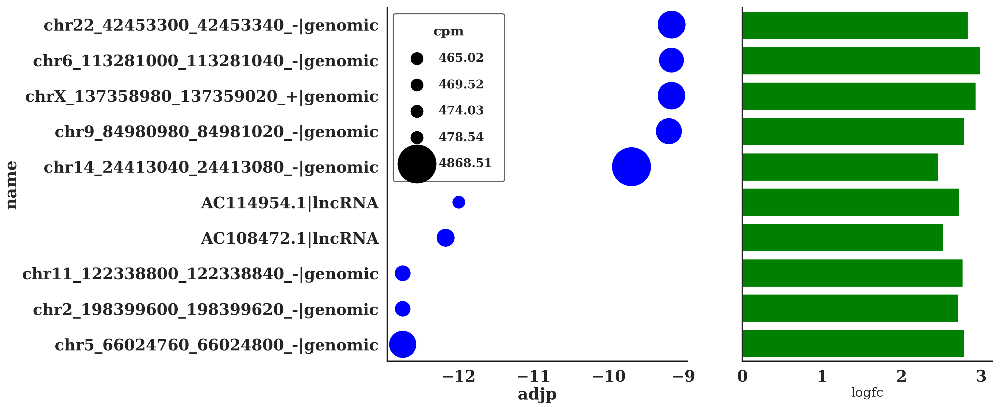

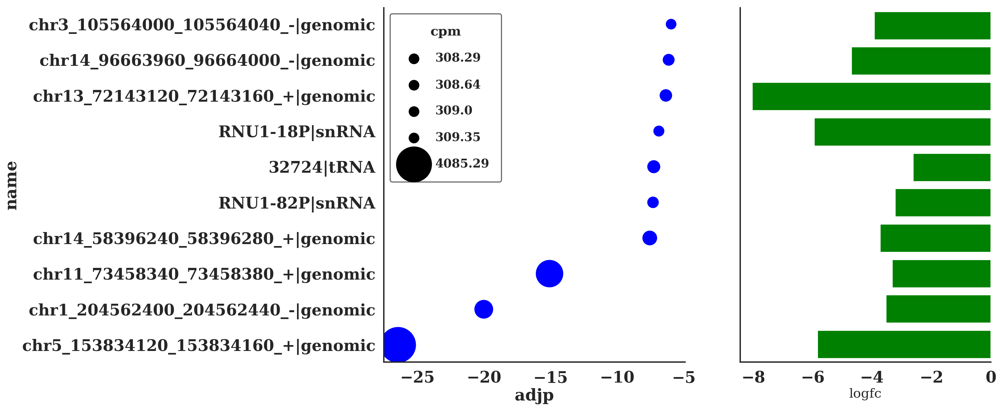

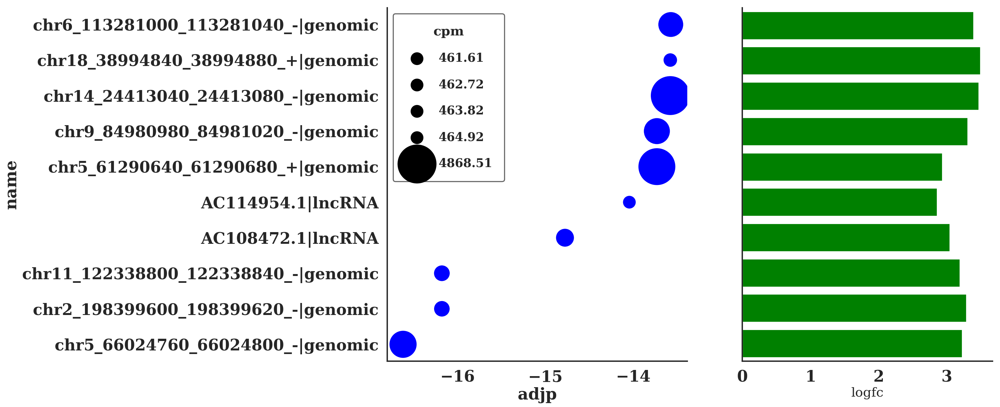

In [509]:
def DE_bar_plot(detable,rpkmtable,nums_retain=10):
    remain_table = detable.sort_values('padj').iloc[:nums_retain]
    featurename = remain_table.index
    featurename = np.array([featurename[i].split('|')[2]+'|'+featurename[i].split('|')[1] for i in range(len(featurename))])
    padj = remain_table.padj
    logfc = remain_table.log2FoldChange
    rpkm = rpkmtable.loc[remain_table.index].mean(axis=1)
    dataframe= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),padj.reshape(-1,1),
                                           logfc.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','padj','logfc','rpkm'])

    #dataframe_rpkm= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','rpkm'])
    dataframe.padj  =  np.log10(dataframe.padj.astype('float'))
    dataframe.logfc  =  pd.to_numeric(dataframe.logfc)
    dataframe.rpkm  =  pd.to_numeric(dataframe.rpkm)

    fig,ax=plt.subplots(1,3,figsize=(nums_retain*4,12))
    sns.barplot(ax=ax[0],data=dataframe,y='name',x='padj',color='r',saturation=1)
    ax[0].set_xlabel('log10 adjusted p value')
    sns.barplot(ax=ax[1],data=dataframe,y='name',x='logfc',color='b',saturation=1)
    sns.barplot(ax=ax[2],data=dataframe,y='name',x='rpkm',color='g',saturation=1)
    #sns.barplot(ax=ax[2],data=dataframe_rpkm.iloc[:nums_retain],y='name',x='rpkm',color='g',saturation=1)
    if sequencing_type =='short':
        ax[2].set_xlabel('cpm')
    elif sequencing_type =='long':
        ax[2].set_xlabel('rpkm')
    plt.figure(linewidth=30.5)
    for i in range(3):
        ax[i].spines['right'].set_visible(False)
        ax[i].spines['top'].set_visible(False)
    fig.tight_layout()
    if savefig:
        fig.savefig(savepath+compare_group+'_bar_plot.png', bbox_inches='tight')
    ax[1].get_yaxis().set_ticks([])
    ax[1].set_ylabel('')
    ax[2].get_yaxis().set_ticks([])
    ax[2].set_ylabel('')
    fig.tight_layout()
    
def DE_bar_plot_(detable,rpkmtable,nums_retain=10):
    remain_table = detable.sort_values('padj').iloc[:nums_retain]
    featurename = remain_table.index
    featurename = np.array([featurename[i].split('|')[2]+'|'+featurename[i].split('|')[1] for i in range(len(featurename))])
    padj = remain_table.padj
    logfc = remain_table.log2FoldChange
    rpkm = rpkmtable.loc[remain_table.index].mean(axis=1)
    dataframe= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),padj.reshape(-1,1),
                                           logfc.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','padj','logfc','rpkm'])

    #dataframe_rpkm= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','rpkm'])
    dataframe.padj  =  np.log10(dataframe.padj.astype('float'))
    dataframe.logfc  =  pd.to_numeric(dataframe.logfc)
    dataframe.rpkm  =  pd.to_numeric(dataframe.rpkm)

    fig,ax=plt.subplots(1,2,figsize=(nums_retain*4,12))
    #sns.barplot(ax=ax[0],data=dataframe,y='name',x='padj',color='r',saturation=1)
    #for i in range(nums_retain):
        #display(pd.DataFrame(dataframe.iloc[i]).T)
    sns.stripplot(ax=ax[0],y='name',x='padj', data = dataframe, 
               palette="Set1", size=np.arange(100,200,10))#dataframe.rpkm[i])
    ax[0].set_xlabel('log10 adjusted p value')
    #sns.barplot(ax=ax[1],data=dataframe,y='name',x='logfc',color='b',saturation=1)
    sns.barplot(ax=ax[1],data=dataframe,y='name',x='logfc',color='g',saturation=1)
    #sns.barplot(ax=ax[2],data=dataframe_rpkm.iloc[:nums_retain],y='name',x='rpkm',color='g',saturation=1)
    
    if sequencing_type =='short':
        mattype = 'cpm'
    elif sequencing_type =='long':
        mattype = 'rpkm'
    ax[1].set_xlabel(mattype)
    plt.figure(linewidth=30.5)
    for i in range(2):
        ax[i].spines['right'].set_visible(False)
        ax[i].spines['top'].set_visible(False)
    fig.tight_layout()
    if savefig:
        fig.savefig(savepath+compare_group+'_bar_plot.png', bbox_inches='tight')
    ax[1].get_yaxis().set_ticks([])
    ax[1].set_ylabel('')
    #ax[2].get_yaxis().set_ticks([])
    #ax[2].set_ylabel('')
    fig.tight_layout()
def DE_bar_plot__(detable,rpkmtable,nums_retain=10):
    remain_table = detable.sort_values('padj').iloc[:nums_retain]
    featurename = remain_table.index
    featurename = np.array([featurename[i].split('|')[2]+'|'+featurename[i].split('|')[1] for i in range(len(featurename))])
    padj = remain_table.padj
    logfc = remain_table.log2FoldChange
    rpkm = rpkmtable.loc[remain_table.index].mean(axis=1)
    dataframe= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),padj.reshape(-1,1),
                                           logfc.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','padj','logfc','rpkm'])

    #dataframe_rpkm= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','rpkm'])
    dataframe.padj  =  np.log10(dataframe.padj.astype('float'))
    dataframe.logfc  =  pd.to_numeric(dataframe.logfc)
    dataframe.rpkm  =  pd.to_numeric(dataframe.rpkm)    
    #display(dataframe)
    f, (ax, ax1) = plt.subplots(1,2, figsize=(nums_retain*2,12),gridspec_kw = {'width_ratios':[1.2, 1]})
    scalefactor=1
    ax.scatter(dataframe.padj, np.arange(10),
                c = 'b', s=(dataframe.rpkm)*5, cmap="viridis")
    ax.set_xlabel("adjp",fontsize=30,fontdict=dict(weight='bold'))
    ax.set_ylabel("name",fontsize=30,fontdict=dict(weight='bold'))
    ax.set_yticks(np.arange(10))
    ax.set_yticklabels(featurename)
    if sequencing_type =='short':
        mattype = 'cpm'
    elif sequencing_type =='long':
        mattype = 'rpkm'
    #make a legend:
    pws = np.round(np.array([np.min(dataframe.rpkm),np.percentile(dataframe.rpkm,0.2),
                   np.percentile(dataframe.rpkm,0.4),np.percentile(dataframe.rpkm,0.6),
                   np.percentile(dataframe.rpkm,0.8),np.max(dataframe.rpkm)])*5,2)
    for pw in pws:
        ax.scatter([], [], s=pw*scalefactor, c="k",label=str(pw))
        
    h,l = ax.get_legend_handles_labels()
    ax.legend(h[1:], l[1:], labelspacing=1.2, title=mattype, borderpad=1, 
                frameon=True, framealpha=0.6, edgecolor="k", facecolor="w")
    sns.barplot(ax=ax1,data=dataframe,y='name',x='logfc',color='g',saturation=1)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)
    ax1.spines['top'].set_visible(False)
    fig.tight_layout()
    if savefig:
        fig.savefig(savepath+compare_group+'_bar_plot.png', bbox_inches='tight')
    ax1.get_yaxis().set_ticks([])
    ax1.set_ylabel('')
    
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    if sequencing_type =='short':
        tmptable = cpm_table_origin
    elif sequencing_type =='long':
        tmptable = rpkm_table_origin
    detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                       ,index_col=0)
    DE_bar_plot__(detable,tmptable,nums_retain=10)

## expression value of selected feature in TCGA data

In [510]:
tcga_dataset = 'tcga_crc'
tcga_cpm = pd.read_table('output/'+tcga_dataset+
                         '/matrix_processing/filter.null.Norm_CPM.Batch_null.transcript.txt',index_col=0)
#tcga_cpm = pd.read_table('output/'+tcga_dataset+
#                        '/count_matrix/transcript.txt',index_col=0)

selectedfeature = selected_features['Normal-CRC']
selectedfeature[np.isin(np.char.lower(np.array(selectedfeature).astype('str')),
                        np.char.lower(np.array(tcga_cpm.index).astype('str')))]


Index(['hsa-miR-125a-5p|miRNA|hsa-miR-125a-5p|hsa-miR-125a-5p|hsa-miR-125a-5p|0|24',
       'hsa-miR-339-3p|miRNA|hsa-miR-339-3p|hsa-miR-339-3p|hsa-miR-339-3p|0|23',
       'hsa-miR-191-3p|miRNA|hsa-miR-191-3p|hsa-miR-191-3p|hsa-miR-191-3p|0|22',
       'hsa-miR-744-3p|miRNA|hsa-miR-744-3p|hsa-miR-744-3p|hsa-miR-744-3p|0|22',
       'hsa-miR-151a-3p|miRNA|hsa-miR-151a-3p|hsa-miR-151a-3p|hsa-miR-151a-3p|0|21'],
      dtype='object')

In [511]:
sample_class_tcga = pd.read_table('data/'+tcga_dataset+'/sample_classes.txt',index_col=0)

In [512]:
selectedfeature_overlap = selectedfeature[np.isin(np.char.lower(np.array(selectedfeature).astype('str')),
                        np.char.lower(np.array(tcga_cpm.index).astype('str')))]

In [513]:
testtable = tcga_cpm.loc[selectedfeature_overlap]

In [514]:
testtable

,TCGA-AA-3664-01A-01T-0906-13,TCGA-AA-3855-01A-01T-1021-13,TCGA-A6-2671-01A-01T-1409-13,TCGA-AA-3527-01A-01T-0822-13,TCGA-D5-5539-01A-01T-1652-13,TCGA-AA-3869-01A-01T-1021-13,TCGA-AA-3812-01A-01T-0906-13,TCGA-AA-3989-01A-01T-1021-13,TCGA-A6-2677-01A-01T-0822-13,TCGA-AA-3971-01A-01T-1021-13,...,TCGA-AG-3591-01A-01T-1735-13,TCGA-AG-3592-01A-02T-1735-13,TCGA-AG-3901-01A-01T-1120-13,TCGA-AF-5654-01A-01T-1659-13,TCGA-AG-4007-01A-01T-1120-13,TCGA-AG-3609-01A-02T-0827-13,TCGA-AG-4015-01A-01T-1120-13,TCGA-AF-2689-11A-01R-1757-13,TCGA-AF-2692-11A-01R-1757-13,TCGA-AF-2691-11A-01R-1757-13
hsa-miR-125a-5p|miRNA|hsa-miR-125a-5p|hsa-miR-125a-5p|hsa-miR-125a-5p|0|24,42.655272,263.397106,228.206952,227.640600,189.780075,151.690777,150.625047,138.554740,184.596576,178.053100,...,87.584745,234.404666,254.529241,171.991029,95.573098,55.271865,156.295977,7005.394188,7721.004987,6249.519291
hsa-miR-339-3p|miRNA|hsa-miR-339-3p|hsa-miR-339-3p|hsa-miR-339-3p|0|23,8.345597,20.443645,9.070988,5.030731,5.145881,24.061296,19.375006,4.861570,10.087245,19.903217,...,3.779699,11.482661,5.562265,8.780323,10.253053,6.218085,31.498424,13.004640,5.321895,4.883391
hsa-miR-191-3p|miRNA|hsa-miR-191-3p|hsa-miR-191-3p|hsa-miR-191-3p|0|22,29.673233,13.629097,8.116147,10.690304,2.881693,5.230716,7.812502,9.115443,16.139591,9.682646,...,2.606689,6.335261,6.229737,10.588036,5.858887,2.763593,10.366570,19.849187,12.772548,15.871020
hsa-miR-744-3p|miRNA|hsa-miR-744-3p|hsa-miR-744-3p|hsa-miR-744-3p|0|22,115.911066,22.517638,18.619396,38.359328,4.322540,33.476585,36.875012,38.183580,63.549641,13.448119,...,23.199531,18.015899,12.904455,19.884849,14.647218,8.290780,56.617420,4.791183,4.257516,3.662543
hsa-miR-151a-3p|miRNA|hsa-miR-151a-3p|hsa-miR-151a-3p|hsa-miR-151a-3p|0|21,3399.439732,2283.466247,2617.218644,1050.794038,1508.978018,2077.640570,1851.563079,1591.860274,785.796353,1679.401139,...,4868.643084,3050.230307,1375.436860,3954.760678,2346.850519,1297.507032,3589.624180,553.723879,452.361059,400.438040


In [515]:
appended_table = []
for i in range(testtable.shape[0]):
    appended_table.append(pd.DataFrame(np.concatenate((np.array(sample_class_tcga.loc[testtable.columns]).reshape(-1,1),
                            np.array(testtable.iloc[i].T).reshape(-1,1),
              np.repeat(testtable.index[i].split('|')[2],testtable.shape[1]).reshape(-1,1)),axis=1)))
appended_table=  pd.concat(appended_table, axis=0)
appended_table.columns = ['class','value','gene']
appended_table.value = np.log2(pd.to_numeric(appended_table.value)+0.001)
appended_table['class'][appended_table['class']!='Normal'] ='Cancer'

In [516]:
sys.path.append('bin')

In [517]:
from statannot import *#add_stat_annotation

In [518]:
np.array([((selectedfeature_overlap[i].split('|')[2],'Normal'),
           (selectedfeature_overlap[i].split('|')[2],'Cancer')) 
          for i in range(selectedfeature_overlap.shape[0])])

array([[['hsa-miR-125a-5p', 'Normal'],
        ['hsa-miR-125a-5p', 'Cancer']],

       [['hsa-miR-339-3p', 'Normal'],
        ['hsa-miR-339-3p', 'Cancer']],

       [['hsa-miR-191-3p', 'Normal'],
        ['hsa-miR-191-3p', 'Cancer']],

       [['hsa-miR-744-3p', 'Normal'],
        ['hsa-miR-744-3p', 'Cancer']],

       [['hsa-miR-151a-3p', 'Normal'],
        ['hsa-miR-151a-3p', 'Cancer']]], dtype='<U15')

pvalue annotation legend:
ns: 5.00e-02 < p <= 1.00e+09
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

hsa-miR-125a-5p_Normal v.s. hsa-miR-125a-5p_Cancer: MWW RankSum two-sided P_val=4.423e-08 U_stat=1.320e+03
hsa-miR-339-3p_Normal v.s. hsa-miR-339-3p_Cancer: MWW RankSum two-sided P_val=9.042e-01 U_stat=6.750e+02
hsa-miR-191-3p_Normal v.s. hsa-miR-191-3p_Cancer: MWW RankSum two-sided P_val=8.495e-06 U_stat=1.197e+03
hsa-miR-744-3p_Normal v.s. hsa-miR-744-3p_Cancer: MWW RankSum two-sided P_val=1.942e-06 U_stat=8.600e+01
hsa-miR-151a-3p_Normal v.s. hsa-miR-151a-3p_Cancer: MWW RankSum two-sided P_val=8.086e-08 U_stat=1.300e+01


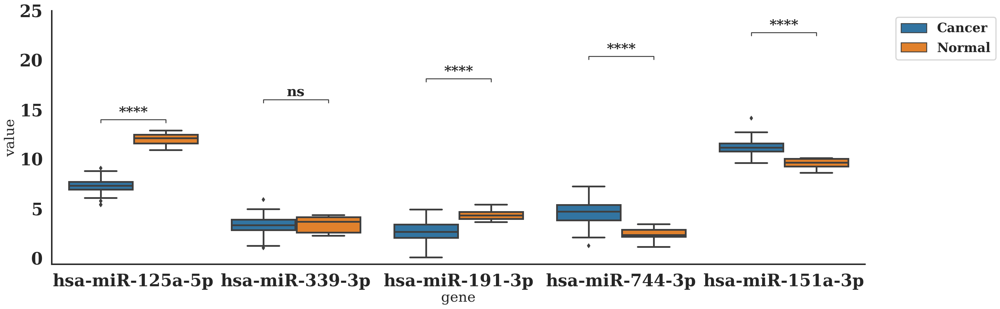

<Figure size 720x480 with 0 Axes>

In [520]:
fig,ax=plt.subplots(1,figsize=(selectedfeature_overlap.shape[0]*5,8))

plt.figure(linewidth=30.5)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

x = 'gene'
y = 'value'
hue = 'class'
sns.boxplot(ax=ax,data=appended_table, x=x, y=y, hue=hue)
add_stat_annotation(ax=ax, data=appended_table, x=x, y=y, hue=hue,
                    boxPairList=np.array([((selectedfeature_overlap[i].split('|')[2],'Normal'),
           (selectedfeature_overlap[i].split('|')[2],'Cancer')) 
          for i in range(selectedfeature_overlap.shape[0])]),
                    test='Mann-Whitney',  loc='inside', verbose=2,#textFormat='full'
                   )
ax.legend(loc='upper left', bbox_to_anchor=(1.03, 1))

In [328]:
tt1 = np.array([selectedfeature[i].split('|')[2].lower() for i in range(selectedfeature.shape[0]) ])

In [329]:
tt2 = np.array([tcga_cpm.index[i].split('|')[2].lower() for i in range(tcga_cpm.index.shape[0]) ])

## ROC: selected feature classification result

In [75]:
def find_metrics_best_for_shuffle(fpr,tpr):
    '''
    used for shuffle roc plot
    '''
    a = 1 - fpr 
    b = tpr
    Sensitivity = b
    Specificity = a
    arith_mean = (Sensitivity+Specificity)*0.5
    geo_mean = (Sensitivity*Specificity)**0.5
    harmo_mean = 2/(1/Sensitivity+1/Specificity)
    eucilid_mean = ((1-Sensitivity)**2+(1-Specificity)**2)**0.5
    auc = sklearn.metrics.auc(a,b)
    thres = 1
    uni,counts= np.unique(np.concatenate((np.argsort(-arith_mean)[:thres],np.argsort(-geo_mean)[:thres],np.argsort(-harmo_mean)[:thres],
                np.argsort(-eucilid_mean)[:thres])),return_counts=True)
    #print (np.max(counts))
    if np.where(counts ==np.max(counts))[0].shape[0] >1:
        ind =1
    else:
        ind =0
    return auc,Sensitivity[uni[np.where(counts ==np.max(counts))][ind]],Specificity[uni[np.where(counts ==np.max(counts))][ind]]
def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

def get_probs_split(filename,interpolatednum=10000,confidence=0.95):
    '''
    get probs from split
    use interpolation to calculate CI
    '''
    xvals = np.linspace(0, 1, interpolatednum)
    with h5py.File(filename,'r') as f:
        predictions =  f['predictions'][:]
        train_index =  f['train_index'][:]
        label = f['labels'][:]
    probs,labels,interpolatedvalue = {},{},{}
    for i in range(predictions.shape[0]):
        probs[i] = predictions[i][~train_index[i]]
        labels[i] = label[~train_index[i]]
        interpolatedvalue[i] = np.interp(xvals,plot_roc( probs[i],labels[i])[1],plot_roc( probs[i],labels[i])[2] )
    interarray = np.array([interpolatedvalue[i]  for i in range(predictions.shape[0])])
    mean,minimum,maximum = np.ndarray([interpolatednum]),np.ndarray([interpolatednum]),np.ndarray([interpolatednum])
    for i in range(interpolatednum):
        mean[i],minimum[i],maximum[i] = mean_confidence_interval(interarray[:,i],confidence)
    return np.concatenate((np.zeros(1),mean,np.ones(1))),np.concatenate((np.zeros(1),minimum,np.ones(1))),\
np.concatenate((np.zeros(1),maximum,np.ones(1))),interpolatednum+2
def plot_roc(prob,label):
    fpr, tpr, _ = roc_curve(label, prob)
    roc_auc = sklearn.metrics.auc(fpr, tpr)
    return roc_auc,fpr, tpr
def find_metrics_best(label,expressionlevel):
    posinum = np.sum(label)
    neganum = label.shape[0] - np.sum(label)
    a,b,c= roc_curve(label,expressionlevel) #fpr tpr threshold
    fp = a*neganum
    tp = b*posinum
    tn = (1-a)*neganum
    fn = (1-b)*posinum
    #Sensitivity = tp/(tp+fn) 
    #Specificity = tn/(tn+fp) 
    Sensitivity = b
    Specificity = 1 - a
    PPV = tp/(tp+fp) 
    NPV = tn/(tn+fn) 
    arith_mean = (Sensitivity+Specificity)*0.5
    geo_mean = (Sensitivity*Specificity)**0.5
    harmo_mean = 2/(1/Sensitivity+1/Specificity)
    eucilid_mean = ((1-Sensitivity)**2+(1-Specificity)**2)**0.5
    mcc_mean = (tp*tn-fp*fn)/(((tp+fp)*(tp+fn)*(tn+fp)*(tn+fn))**0.5)
    F1_score = 2*tp/(2*tp+fn+fp)
    auc = sklearn.metrics.auc(a,b)
    acc = (tp+tn)/(tp+tn+fn+fp)
    distoleftup = (a**2+(1-b)**2)**0.5# to the left up
    #print ("AUC:" +str(auc)) 
    thres = int(label.shape[0]/10.) if int(label.shape[0]/10.)>0 else 1
    uni,counts= np.unique(np.concatenate((np.argsort(-arith_mean)[:thres],np.argsort(-geo_mean)[:thres],np.argsort(-harmo_mean)[:thres],
                np.argsort(-eucilid_mean)[:thres],np.argsort(-mcc_mean)[:thres],np.argsort(-F1_score)[:thres])),return_counts=True)
    #print (np.max(counts))
    if np.where(counts ==np.max(counts))[0].shape[0] >1:
        ind =1
    else:
        ind =0
    return auc,Sensitivity[uni[np.where(counts ==np.max(counts))][ind]],Specificity[uni[np.where(counts ==np.max(counts))][ind]]
def get_auc_stats(root_path,sample_path):
    '''
    sample_path:hccpath,stagepath
    '''
    auc_metrics_jack = {}
    auc_metrics_split = {}
    for i in os.listdir(root_path+sample_path):
        #print (i)
        try:
            print (i, ' file found')
            if i.split('.')[-1] == 'shuffle_split':
                auc_metrics_split[i] = h5py.File(root_path+sample_path+i+'/evaluation.shuffle_split.h5')
            else:
                with h5py.File(root_path+sample_path+i+'/evaluation.leave_one_out.h5','r') as f:
                    predictions =  f['predictions'][:]
                    train_index =  f['train_index'][:]
                    auc_metrics_jack[i]  = predictions[~train_index]
        except:
            print (i, ' file not found')
            print ('files in the directory: ',os.listdir(root_path+sample_path+i))
    return auc_metrics_jack,auc_metrics_split
def get_speci_sensi(filename,spe_criteria=0.99):
    mean,minimum,maximum,interpolatednum = get_probs_split(filename)
    total_nums = mean.shape[0]
    index = round(total_nums *(1-spe_criteria))
    return mean[index],minimum[index],maximum[index]

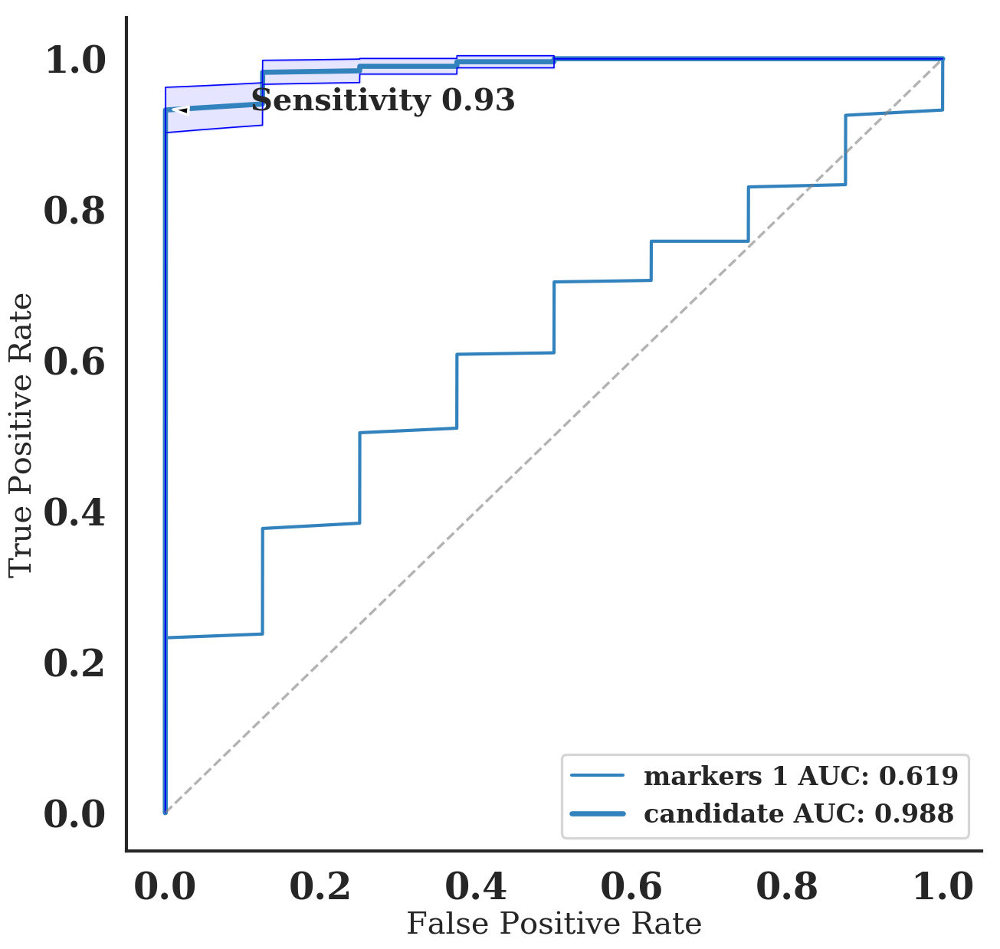

<Figure size 720x480 with 0 Axes>

In [287]:
def plot_shuffle(ax,filename,show_metrics=False,savefigure=False,title=None,
                 spe_criter=0.99,savepath=savepath,savefig=True,
                 compare_group=compare_group,markers_file=None):
    '''
    samplepath: hccpath
    filename: 'logistic_regression.100.robust.stratified_shuffle_split/evaluation.stratified_shuffle_split.h5'
    '''  
    if markers_file is not None:
        for i in range(markers_file.shape[0]):
            mean,_,_,interpolatednum = get_probs_split(markers_file[i])
            xvals = np.linspace(0, 1, interpolatednum)  
            auc,sen,spe = find_metrics_best_for_shuffle(xvals,mean) #tpr,1-fpr
            ax.plot(xvals,mean,linewidth=2.5,color=np.array(Category20c[20]).reshape(4,-1).T.ravel()[i],label='markers '+str(i+1)+' AUC: '+str(np.round(auc,3)))
    mean,minimum,maximum,interpolatednum = get_probs_split(filename)
    xvals = np.linspace(0, 1, interpolatednum)
    ax.fill_between(xvals,minimum,maximum,where=(minimum<=maximum),color='b',alpha=0.1)   
    auc,sen,spe = find_metrics_best_for_shuffle(xvals,mean) #tpr,1-fpr
    numind = np.ceil((1-spe)/(1./(interpolatednum-2))).astype('int')
    ax.plot(xvals,mean,linewidth=4,color=Category20c[20][0],label='candidate AUC: '+str(np.round(auc,3)))
    ax.plot(xvals,minimum,linewidth=1,color='b')
    ax.plot(xvals,maximum,linewidth=1,color='b')
    sen_criter = get_speci_sensi(filename,spe_criteria=spe_criter)[0]
    if show_metrics:
        if sen+0.2<=0.95:
            ax.annotate('Specificity '+str('%0.4s'%(spe)), xy=( 1-spe,sen), xytext=(1-spe, sen+0.2),
            arrowprops=dict(facecolor='black', shrink=0.05,width=1.5,headwidth=6.5),
            )
        else:
            ax.annotate('Specificity '+str('%0.4s'%(spe)), xy=( 1-spe,sen), xytext=(1-spe+0.05, sen-0.2),
            arrowprops=dict(facecolor='black', shrink=0.05,width=1.5,headwidth=6.5),
            )
        ax.annotate('Sensitivity '+str('%0.4s'%sen), xy=( 1-spe,sen), xytext=(1-spe+0.1, sen-0.1),
            arrowprops=dict(facecolor='black', shrink=0.1,width=1.5,headwidth=6.5),
            )
    ax.annotate('Sensitivity '+str('%0.4s'%sen_criter), xy=( 1-spe_criter,sen_criter), xytext=(1-spe_criter+0.1, sen_criter),
        arrowprops=dict(facecolor='black', shrink=0.8,width=1.5,headwidth=6.5),
        )
    ax.legend(prop={'size': 20})
    ax.plot([0,1],[0,1], linewidth=2,alpha=0.6,color='gray',linestyle='--')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    if title is not None:
        ax.set_title(title,fontsize= 25)
    else:
        pass
        #ax.set_title('Receiver Operating Characteristic Curve',fontsize= 25)
    if savefig:
        fig.savefig(savepath+compare_group+'_ROC.png', bbox_inches='tight')
    #return mean,minimum,maximum,interpolatednum
    plt.figure(linewidth=30.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

shuffle_split_roc_file = 'output/'+dataset+'/feature_selection/'+preprocess_method+'/'+compare_group+'/random_forest.10.robust/'
fig,ax=plt.subplots(1,figsize=(12,12))
plot_shuffle(ax,shuffle_split_roc_file+'evaluation.stratified_shuffle_split.h5',
                     spe_criter=0.99,compare_group=compare_group,
                    markers_file=np.array(['output/'+dataset+'/evaluate_features/result/scirep.de_selected_mx/'+compare_group+'/random_forest/evaluation.stratified_shuffle_split.h5'])
             ,title= None,show_metrics=False)

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

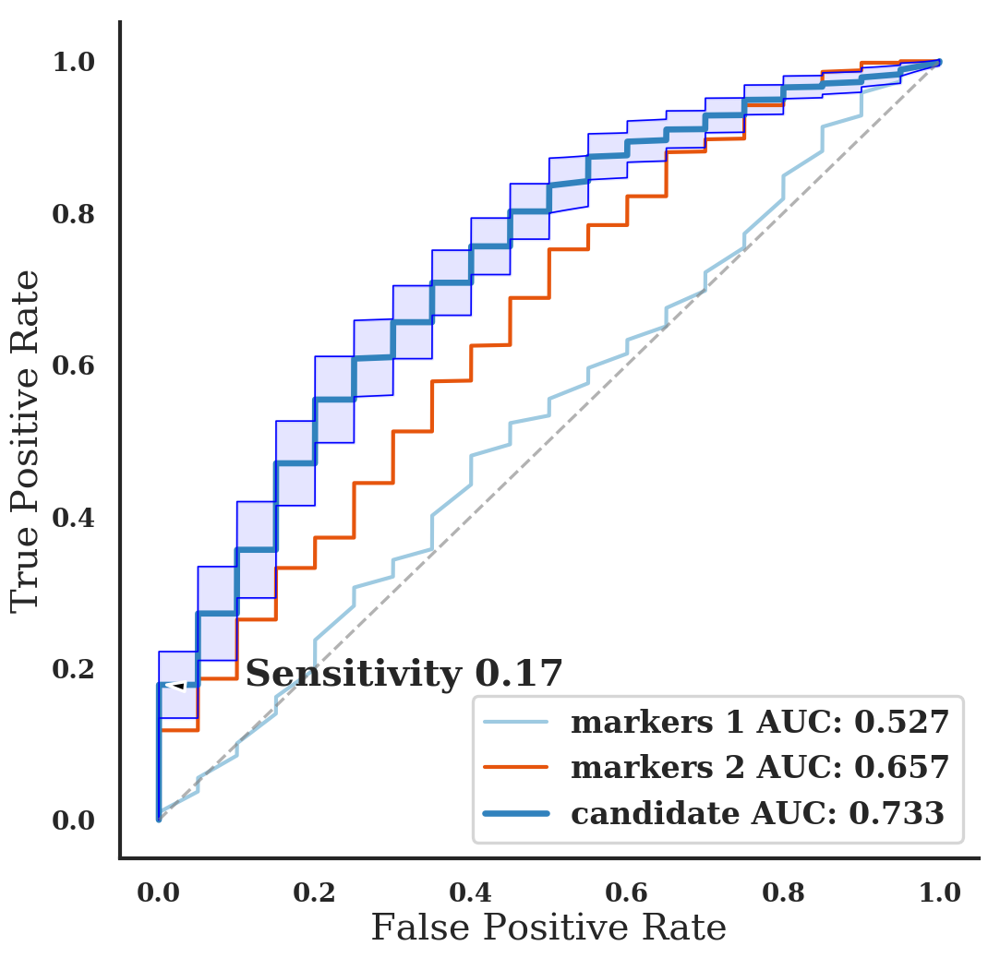

<Figure size 720x480 with 0 Axes>

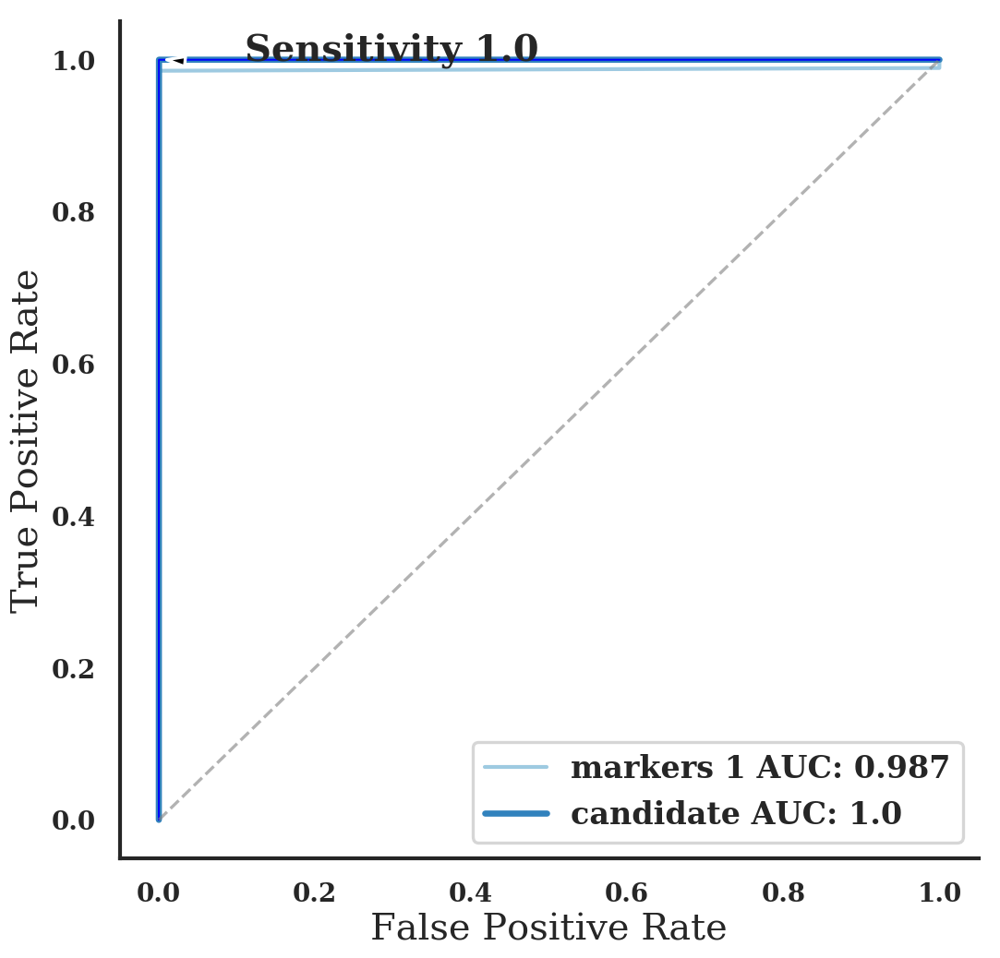

<Figure size 720x480 with 0 Axes>

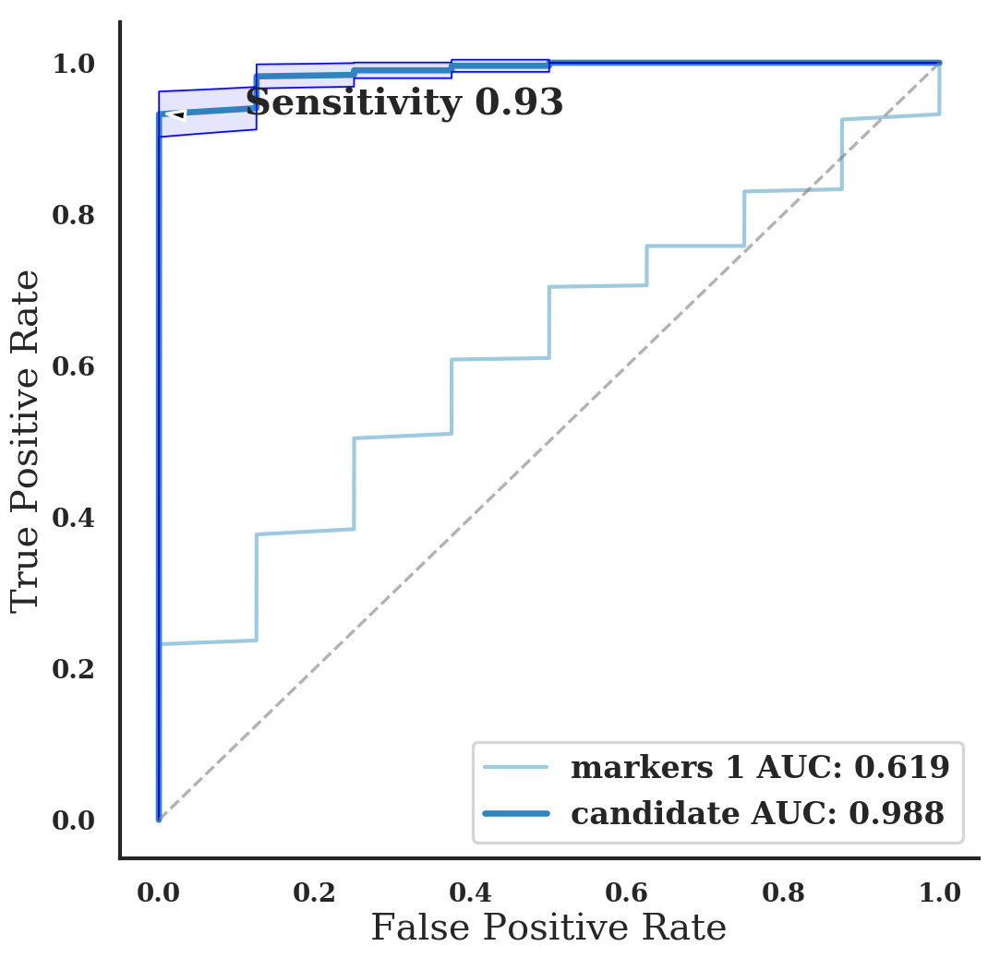

<Figure size 720x480 with 0 Axes>

In [79]:
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    shuffle_split_roc_file = 'output/'+dataset+'/feature_selection/'+preprocess_method+'/'+compare_group+'/random_forest.10.robust/'
    fig,ax=plt.subplots(1,figsize=(10,10))
    if compare_group=='Normal-CRC':
        plot_shuffle(ax,shuffle_split_roc_file+'evaluation.stratified_shuffle_split.h5',
                     spe_criter=0.99,compare_group=compare_group,
                    markers_file=np.array(['output/'+dataset+'/evaluate_features/result/control_markers_0/'+compare_group+'/random_forest/evaluation.stratified_shuffle_split.h5',
            'output/'+dataset+'/evaluate_features/result/scirep.de_selected_mx/'+compare_group+'/random_forest/evaluation.stratified_shuffle_split.h5']),title= None)
    else:
        plot_shuffle(ax,shuffle_split_roc_file+'evaluation.stratified_shuffle_split.h5',
                     spe_criter=0.99,compare_group=compare_group,
                    markers_file=np.array(['output/'+dataset+'/evaluate_features/result/scirep.de_selected_mx/'+compare_group+'/random_forest/evaluation.stratified_shuffle_split.h5']),title= None)

In [67]:
detable = pd.DataFrame(np.loadtxt('DE.scirep.txt'))
detable.columns = np.array(['Colorectal Cancer' ,'Healthy Control', 'Pancreatic Cancer',
 'Prostate Cancer'])

In [68]:
detable.head()

,Colorectal Cancer,Healthy Control,Pancreatic Cancer,Prostate Cancer
0,0.132594,-0.057216,-0.252127,-0.070029
1,0.130987,-0.165175,0.250095,-0.075235
2,0.128979,-0.074835,-0.138220,-0.088057
3,0.128979,-0.138622,0.468379,-0.050010
4,0.120546,-0.093268,0.294102,-0.139425


Text(0,0.5,'Feature')

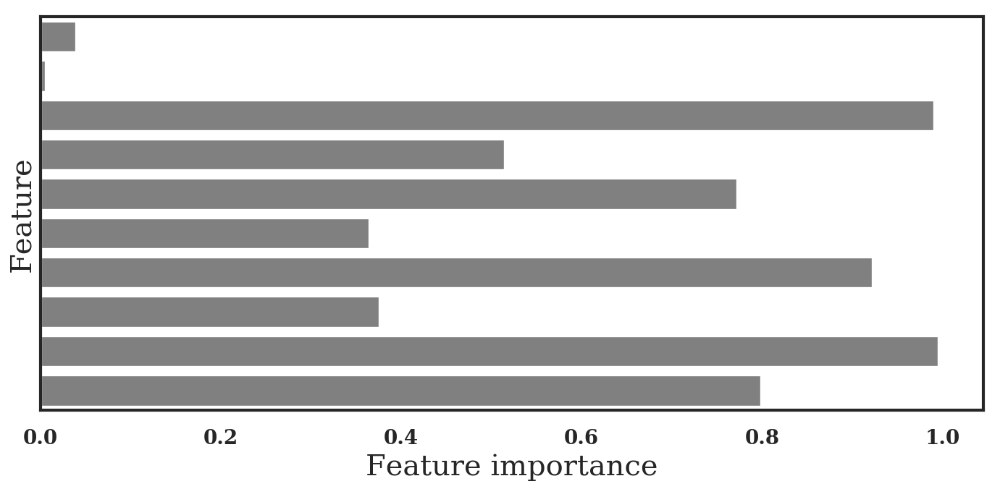

In [80]:
fig, ax = plt.subplots(figsize=(14, 6))
sns.barplot(x=np.abs(np.random.random(10)), y=np.arange(10), color='gray', orient='h',
            ax=ax)
ax.set_yticks([])
ax.set_xlabel('Feature importance')
ax.set_ylabel('Feature')

## Cluster map

In [117]:
cpm_table_use['genetype'] = np.array([feature_matrix.index[i].split('|')[1] for i in range(feature_matrix.shape[0])])
pd.concat((sample_class_use.T,cpm_table_use)).to_csv('tmp.txt',sep='\t')
from clustergrammer_widget import Network, clustergrammer_widget
net = Network(clustergrammer_widget)
net.load_file('tmp.txt')

# cluster using default parameters
net.cluster(enrichrgram=True)

# make interactive widget
net.widget()

In [69]:
def open_file_or_stdout(filename):
    if filename == '-':
        return sys.stdout
    else:
        return open(filename, 'w')
def extract_feature_sequence(output_file,genome_dir,selected_features):
    from pyfaidx import Fasta
    from Bio.Seq import Seq

    fout = open_file_or_stdout(output_file)
    fastas = {}
    for feature in selected_features:
        gene_id, gene_type, gene_name, domain_id, transcript_id, start, end = feature.split('|')
        start = int(start)
        end = int(end)
        if gene_type == 'genomic':
            gene_type = 'genome'
        if gene_type not in fastas:
            fastas[gene_type] = Fasta(os.path.join(genome_dir, 'fasta', gene_type + '.fa'))
        if gene_type == 'genome':
            chrom, gstart, gend, strand = gene_id.split('_')
            gstart = int(gstart)
            gend = int(gend)
            seq = fastas[gene_type][chrom][gstart:gend].seq
            if strand == '-':
                seq = str(Seq(seq).reverse_complement())
        else:
            seq = fastas[gene_type][transcript_id][start:end].seq
        seq = seq.upper()
        fout.write('>{}\n'.format(feature))
        fout.write(seq)
        fout.write('\n')
    fout.close()

In [70]:
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    extract_feature_sequence(savepath+compare_group+'_sequence.txt','/Share/home/shibinbin/projects/exSeek-dev/genome/hg38/',
                         selected_features[compare_group])

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

In [ ]:
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):

In [71]:
compare_group

'Normal-PRAD'

In [86]:
feature_remain = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+exp_mx_name+'domains_combined.txt').index
genename_remain = np.array([feature_remain[i].split('|')[0] for i
                            in range(feature_remain.shape[0])])
control_markers = {}
control_markers['Normal-CRC'] = {}
control_markers['Normal-CRC'][0] = np.array(['hsa-mir-93'])
control_markers['Normal-PAAD'] = {}
control_markers['Normal-PAAD'][0] = np.array(['hsa-mir-106b'])


best_processed_mx = pd.read_table('output/'+dataset+'/matrix_processing/'+
              best_preprocess_methods['Normal-CRC']+'.txt')



In [90]:
for i in range(1):
    tmptab = best_processed_mx.iloc[np.isin(genename_remain,control_markers[i])]
    tmptab.to_csv('control_markers/'+dataset+'/data/control_markers_'+str(i)+'.txt',sep='\t')


#CRC
miR-92-3p,miR-21,miR-139-3p,miR-431
miR-20a
miR-26a
miR-124-5p
miR-141
miR-183
miR-221
miR-200c
miR-25-3p
miR-331-3p
miR-103a-3p
miR-127-3p
miR-151a-5p
miR-17-5p
miR-181a-5p
miR-18a-5p
miR-18b-5p
miR18a
miR19a
miR19b
miR15b
miR29a
miR335
miR-92
miR-17-3p

#Pancreat
miR-106b

miR-10b
miR-21
miR-30c
miR-20a
miR- 181a
miR-483
miR-let7a
miR-122
miR-22
miR-642
miR-885
miR-223
miR-744
miR-10b
miR-30c
miR-106b
miR-155
miR-212
Panel(miR-10b, miR-106b)
miR-182
miR-16
miR-885
miR-22
miR-642
Panel (miR-885, miR-22, miR-642)
miR-221
Panel (miR-16, miR-196a)
miR-21
miR-210
miR-155
miR-196a
Panel (miR-21,miR-210, miR-155, miR-196a)

#prostate
miR-30c
miR-26b
miR-451
miR-223
miR-24
miR-874
miR-1274a
miR-1207-5p
miR-93
miR-106a
panel(let-7e,let-7c,miR-30c,miR-622 and miR-1285)
miR-21
miR-221
miRNA-375
miRNA-141
miR-1290
miR-375
miR-107
miR-130B
miR-141
miR-181a-2
miR-2110
miR-301A
miR-326
miR-331-3p
miR-432
miR-484
miR-574-3p
miR-625